In [1]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from shapely import wkt
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
import warnings
import seaborn as sns

warnings.filterwarnings("ignore")

In [2]:
# import data
neighborhoods = gpd.read_file('data/neighborhood.geojson')
neighborhoods = neighborhoods.to_crs(epsg=3857)
# parking = gpd.read_file('data/Bicycle Parking.geojson')
# parking = parking.to_crs(epsg=3857)

bikeroutes = []
years = ['2017','2018','2019','2020','2021','2022']
for y in years:
    temp = gpd.read_file(f'data/Archived_nyc_bike_routes_{y}/nyc_bike_routes_{y}.shp')
    temp = temp.to_crs(epsg=4326)
    temp = temp.to_crs(epsg=3857)

    temp['year'] = y
    bikeroutes.append(temp)

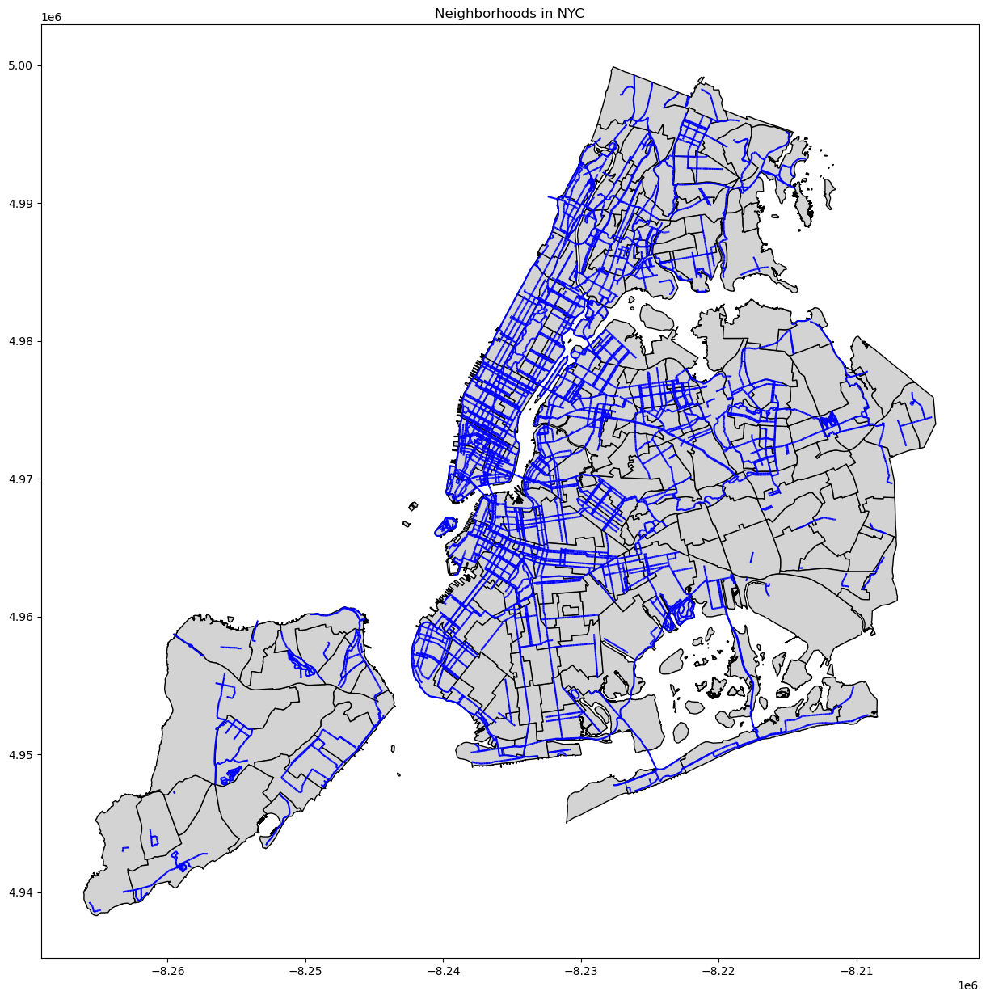

In [3]:
# example of routes in 2022
# parking data is in 2013, ignore in the following work

fig, ax = plt.subplots(figsize=(15, 15))
bikeroutes[-1].plot(ax=ax, color='blue')
neighborhoods.plot(ax=ax, color='lightgrey',edgecolor='black')
# parking.plot(ax=ax,color = 'red',markersize=3)
plt.title('Neighborhoods in NYC')
plt.axis('on')
plt.show()

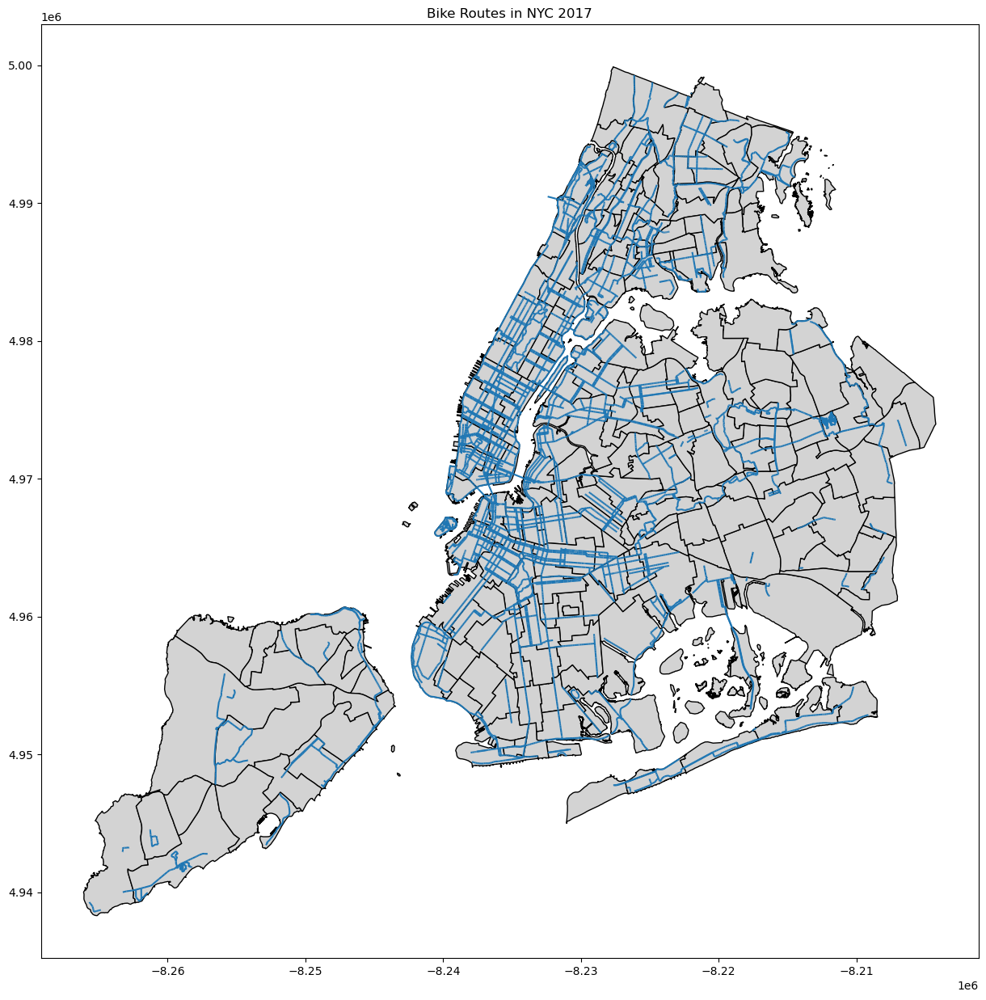

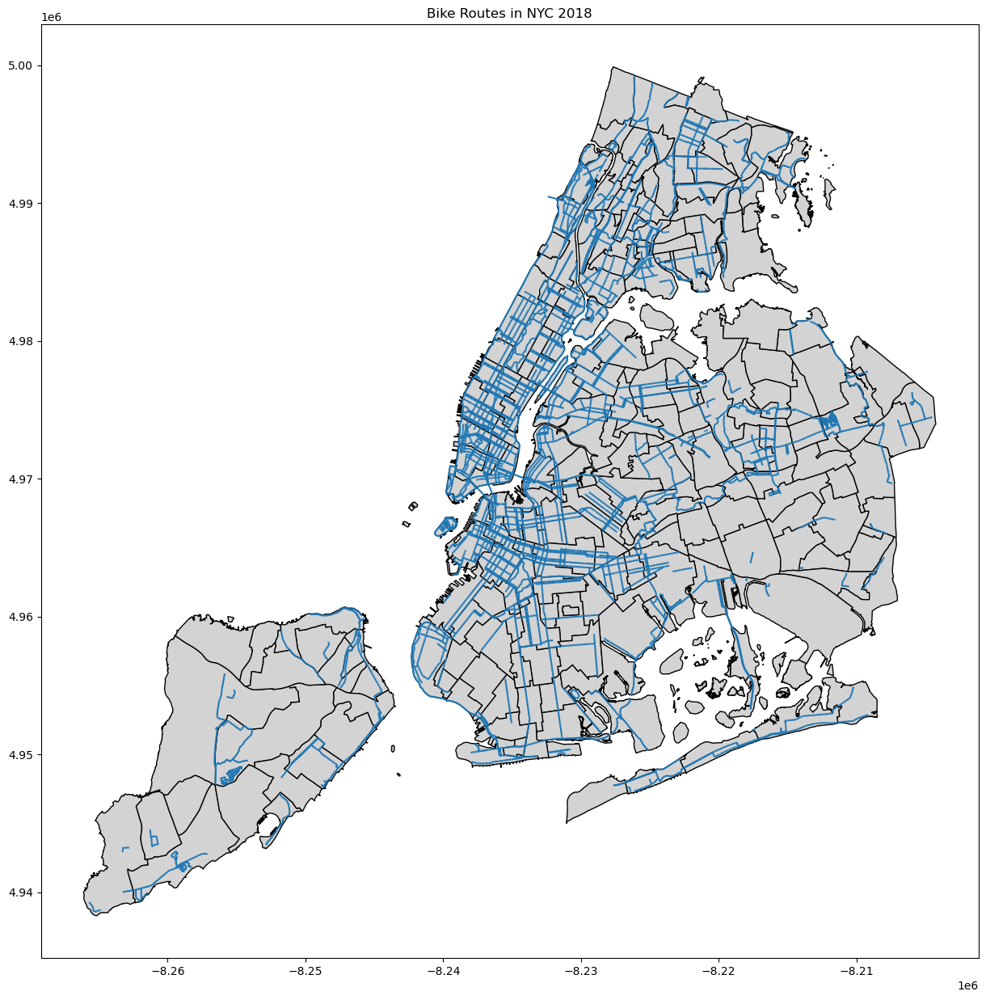

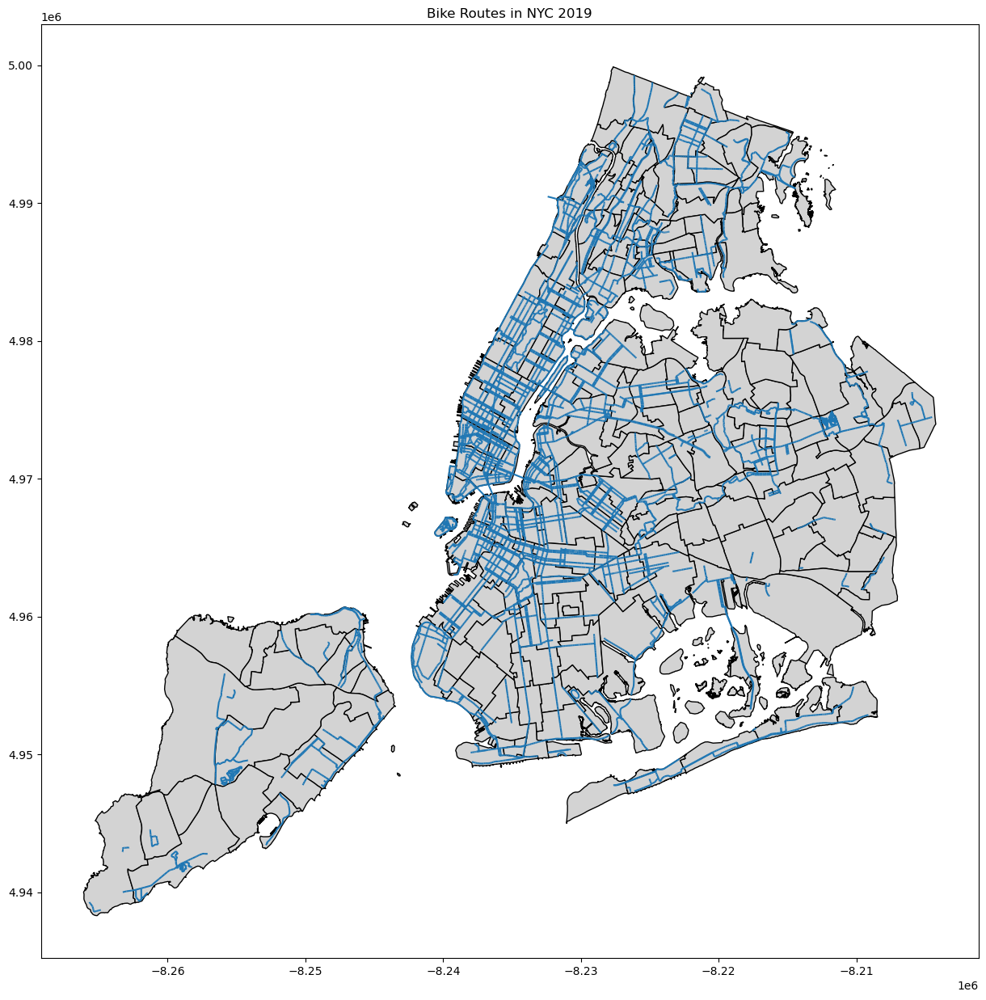

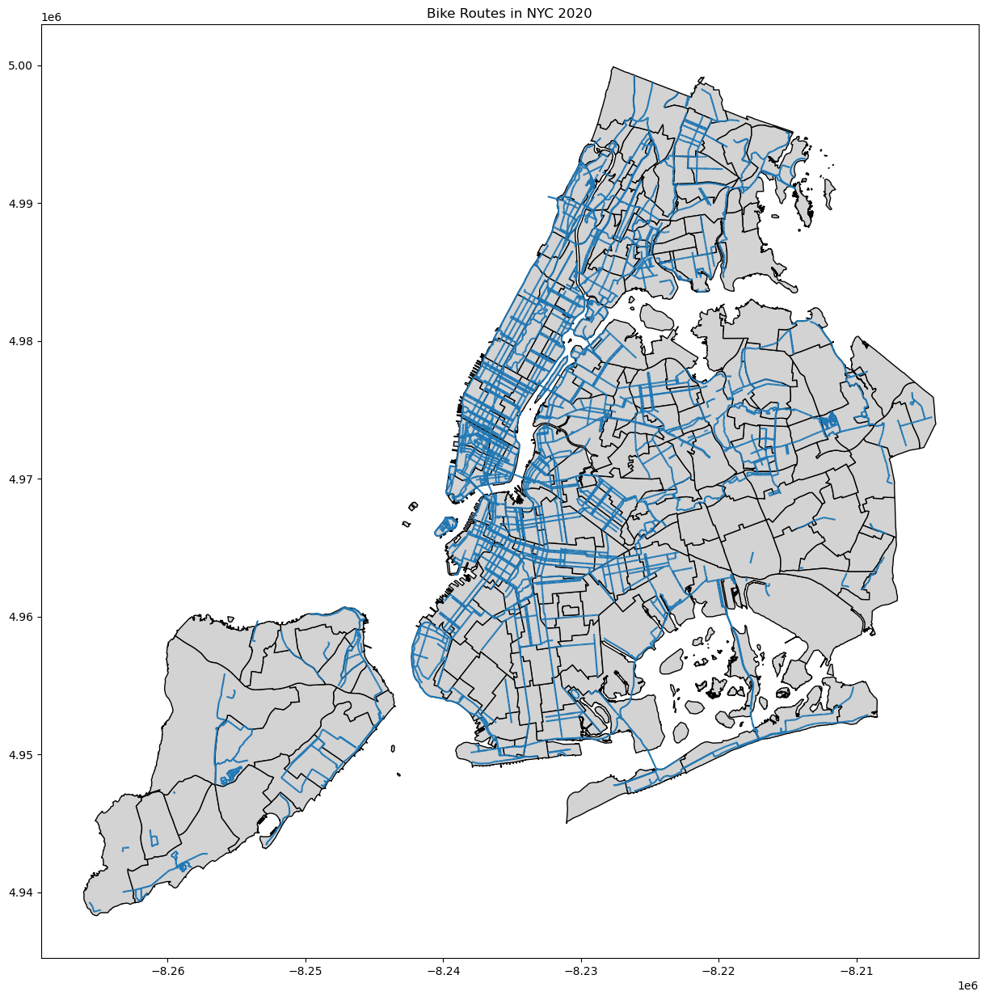

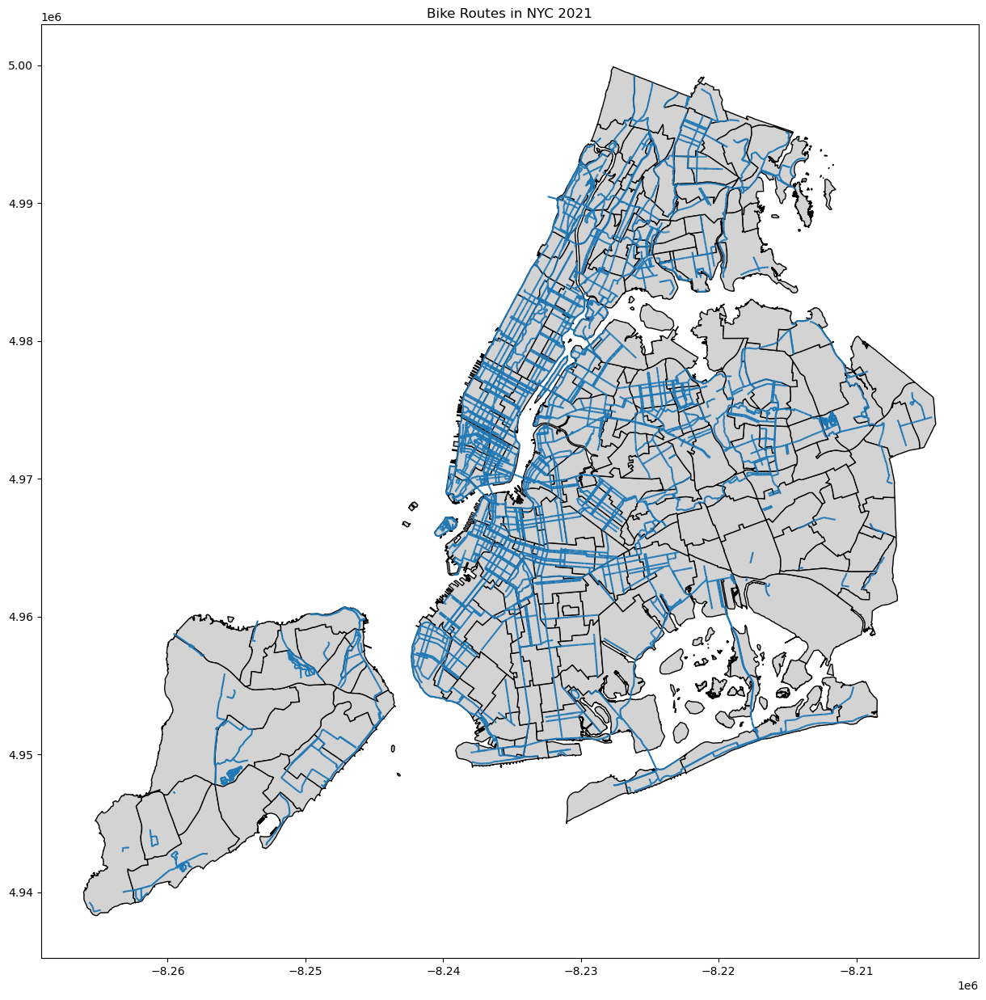

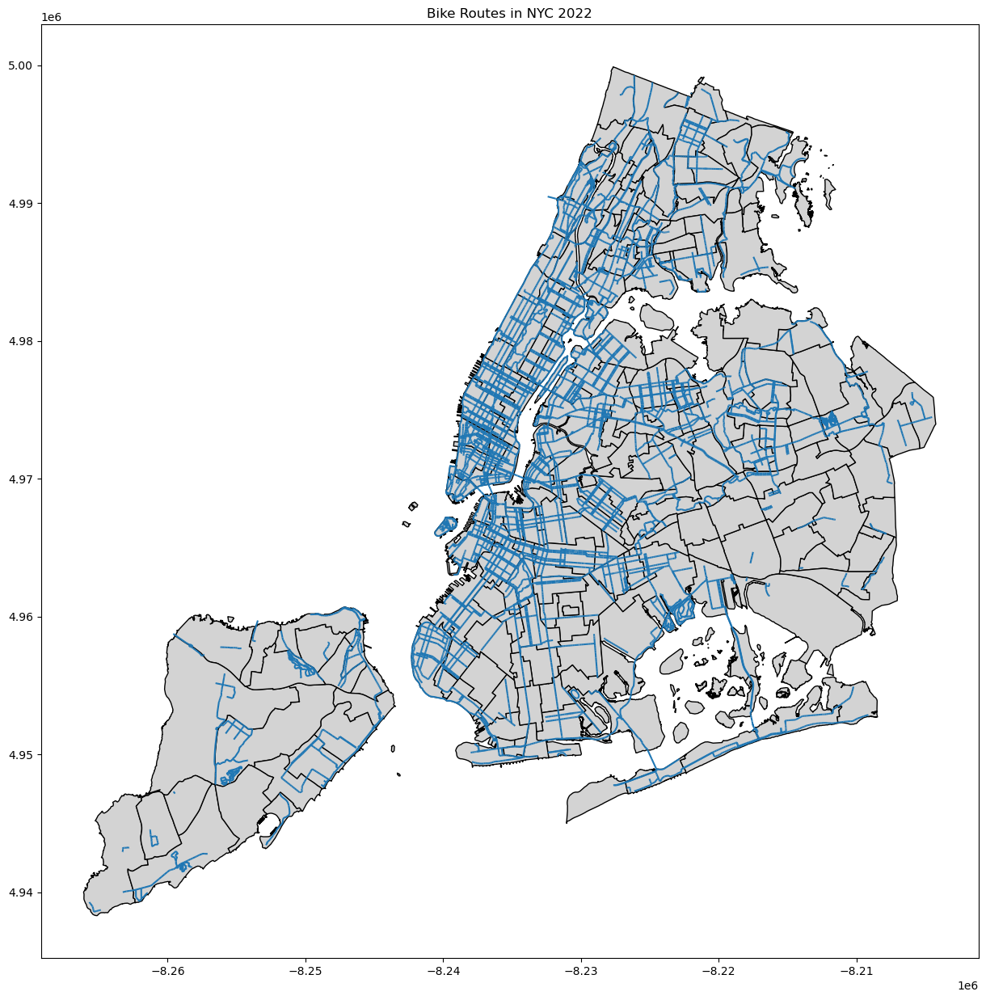

In [4]:
# routes of each year
for i in range(len(years)):
    fig, ax = plt.subplots(figsize=(15, 15))
    bikeroutes[i].plot(ax=ax)
    neighborhoods.plot(ax=ax, color='lightgrey', edgecolor='black')
    plt.title(f'Bike Routes in NYC {years[i]}')
    plt.axis('on')
    plt.show()

In [5]:
# merge route length and density to the neighborhoods

neighborhoods['shape_area'] = pd.to_numeric(neighborhoods['shape_area'])
for i in range(len(years)):
    bikeroutes[i]['route_length'] = bikeroutes[i].geometry.length
    merged_data = gpd.sjoin(neighborhoods, bikeroutes[i], how='left', op='intersects')
    route_counts = merged_data.groupby('ntacode')['route_length'].sum().reset_index(name=f'route_length_{years[i]}')
    neighborhoods = neighborhoods.merge(route_counts, on='ntacode')
    neighborhoods[f'density_route_length_{years[i]}'] = neighborhoods[f'route_length_{years[i]}'] / neighborhoods['shape_area']
neighborhoods.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,route_length_2017,density_route_length_2017,route_length_2018,density_route_length_2018,route_length_2019,density_route_length_2019,route_length_2020,density_route_length_2020,route_length_2021,density_route_length_2021,route_length_2022,density_route_length_2022
0,QN08,7.741275e+07,081,St. Albans,45401.316803,Queens,4,"MULTIPOLYGON (((-8210040.725 4968959.610, -821...",2005.111908,0.000026,2005.111908,0.000026,1797.523208,0.000023,2005.111908,0.000026,1797.523208,0.000023,1797.523208,0.000023
1,BX28,2.566612e+07,005,Van Cortlandt Village,21945.719299,Bronx,2,"MULTIPOLYGON (((-8225068.941 4995298.189, -822...",5923.313151,0.000231,5923.313151,0.000231,6643.952579,0.000259,6351.759625,0.000247,6643.952579,0.000259,6643.952579,0.000259
2,QN55,8.246139e+07,081,South Ozone Park,36708.1693055,Queens,4,"MULTIPOLYGON (((-8216020.556 4965686.155, -821...",841.003208,0.000010,841.003208,0.000010,924.643079,0.000011,841.003208,0.000010,924.643079,0.000011,924.643079,0.000011
3,BK50,8.208968e+07,047,Canarsie,43703.6096661,Brooklyn,3,"MULTIPOLYGON (((-8225212.306 4960370.336, -822...",7183.987423,0.000088,8479.810896,0.000103,8562.473912,0.000104,8687.564139,0.000106,7378.240371,0.000090,7378.240368,0.000090
4,BX41,1.471671e+07,005,Mount Hope,18937.247819,Bronx,2,"MULTIPOLYGON (((-8226021.547 4990914.434, -822...",6047.647382,0.000411,6047.647382,0.000411,6742.587044,0.000458,6551.433904,0.000445,7246.400719,0.000492,7246.400719,0.000492


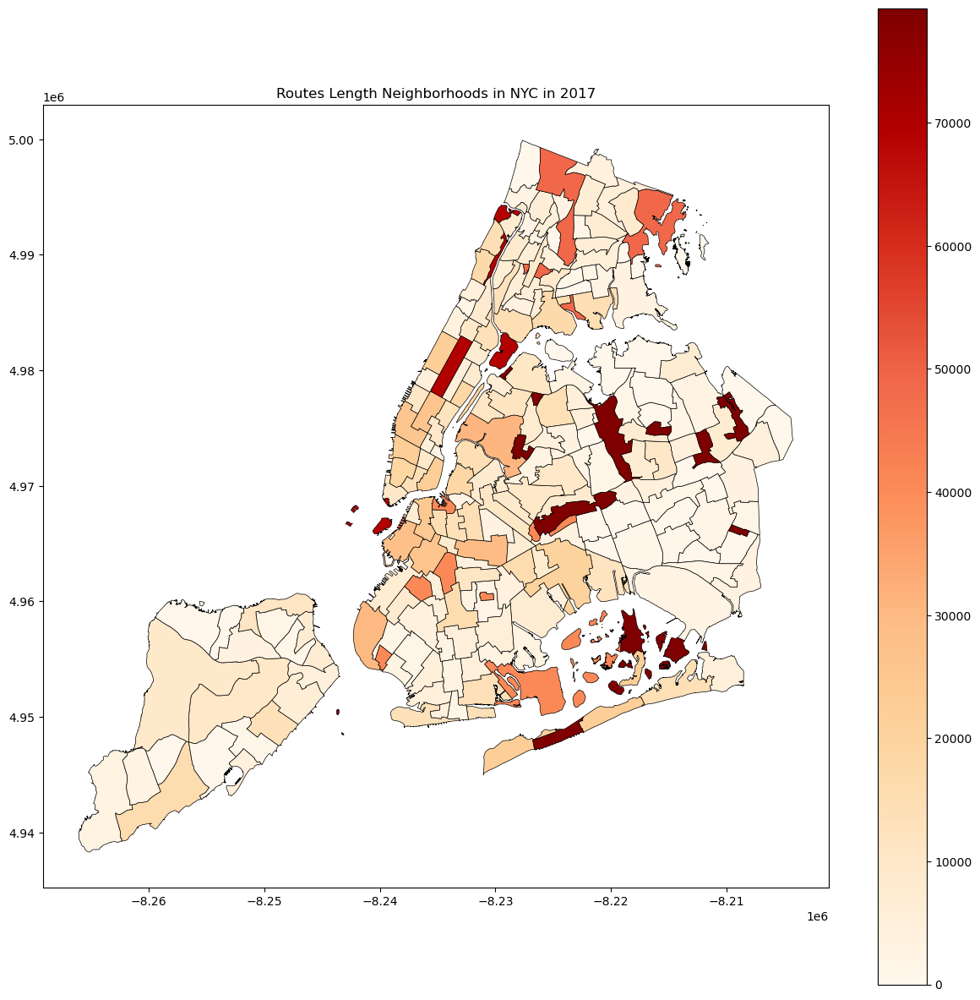

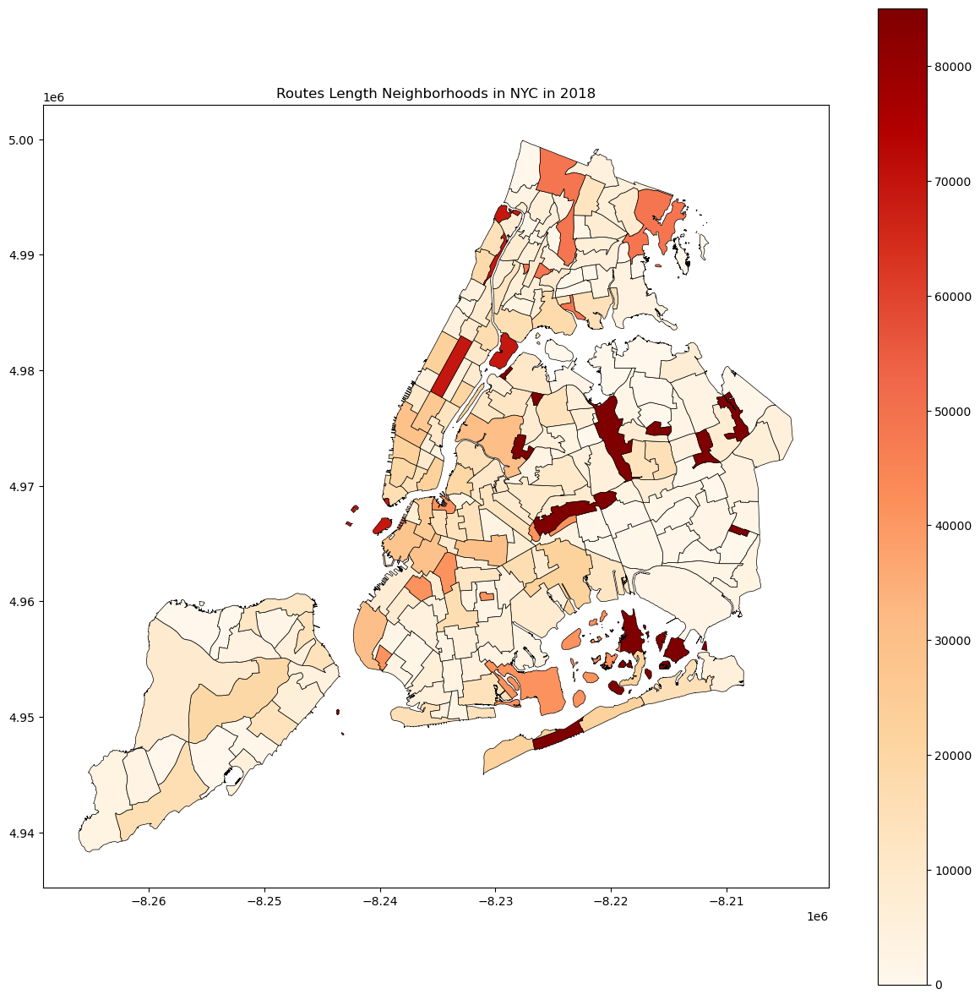

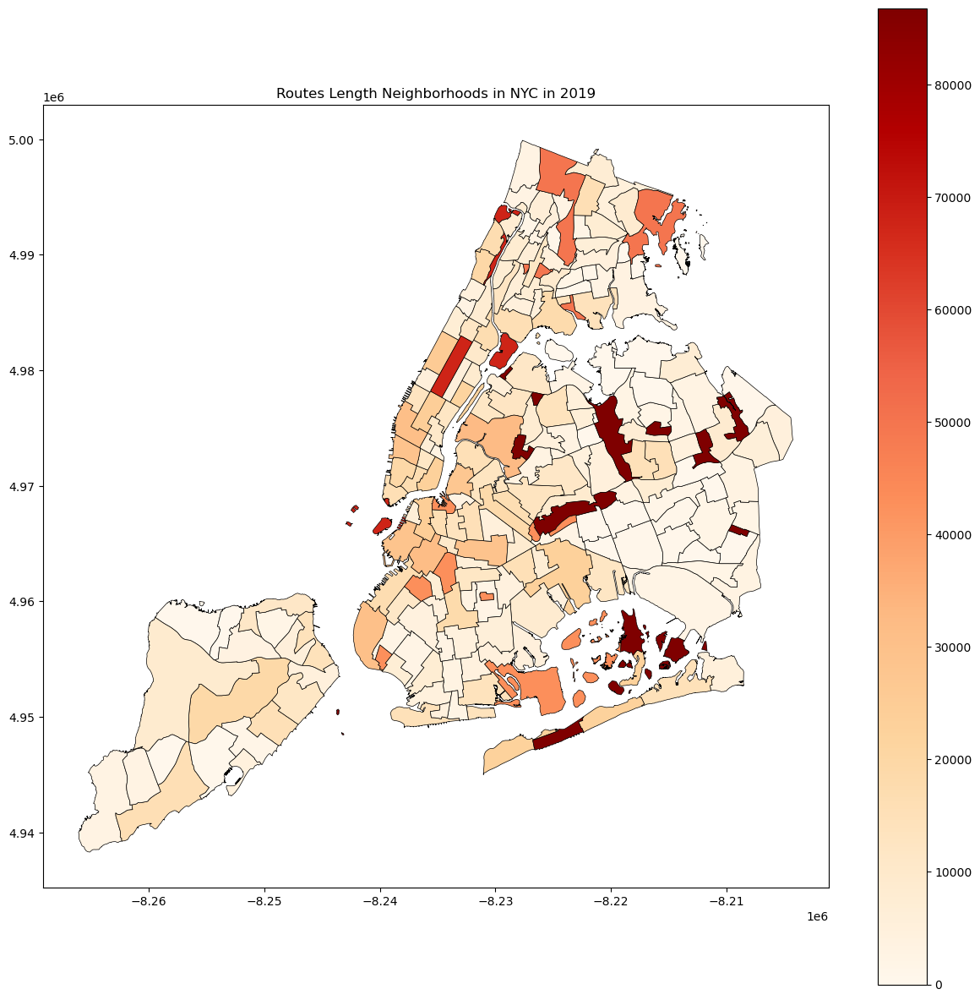

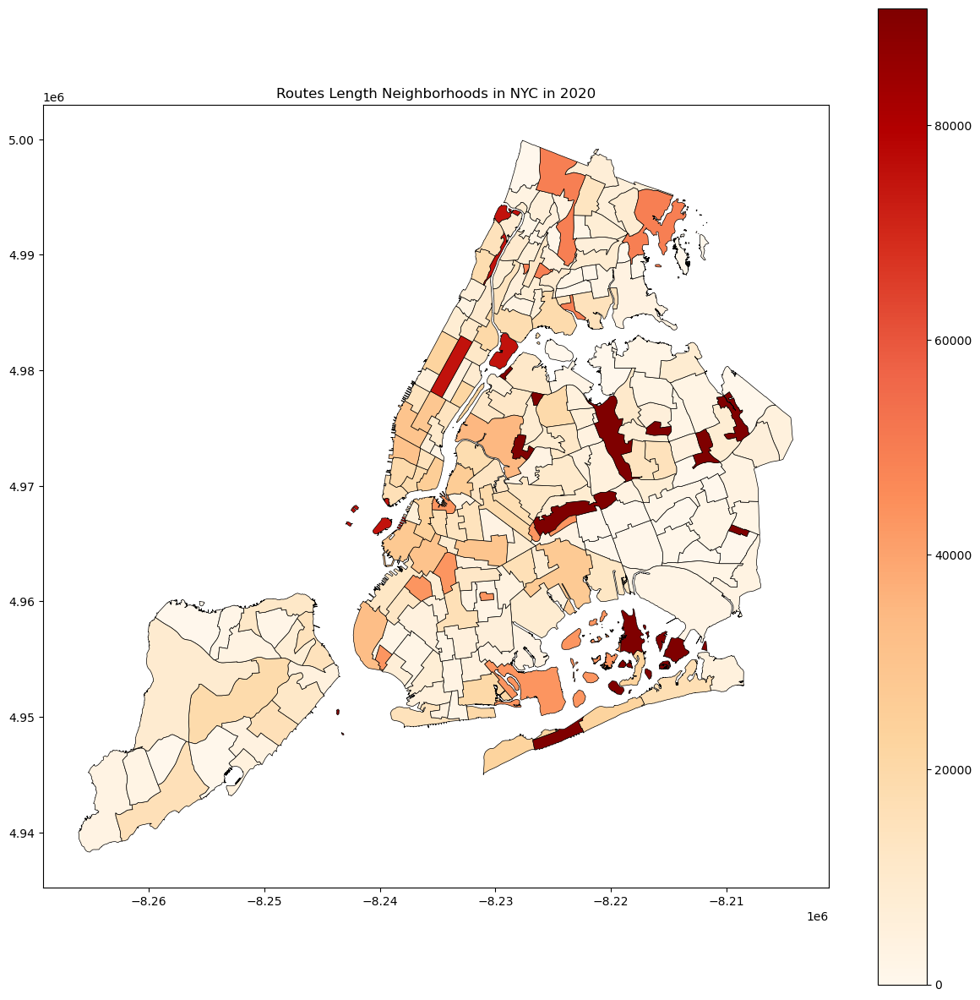

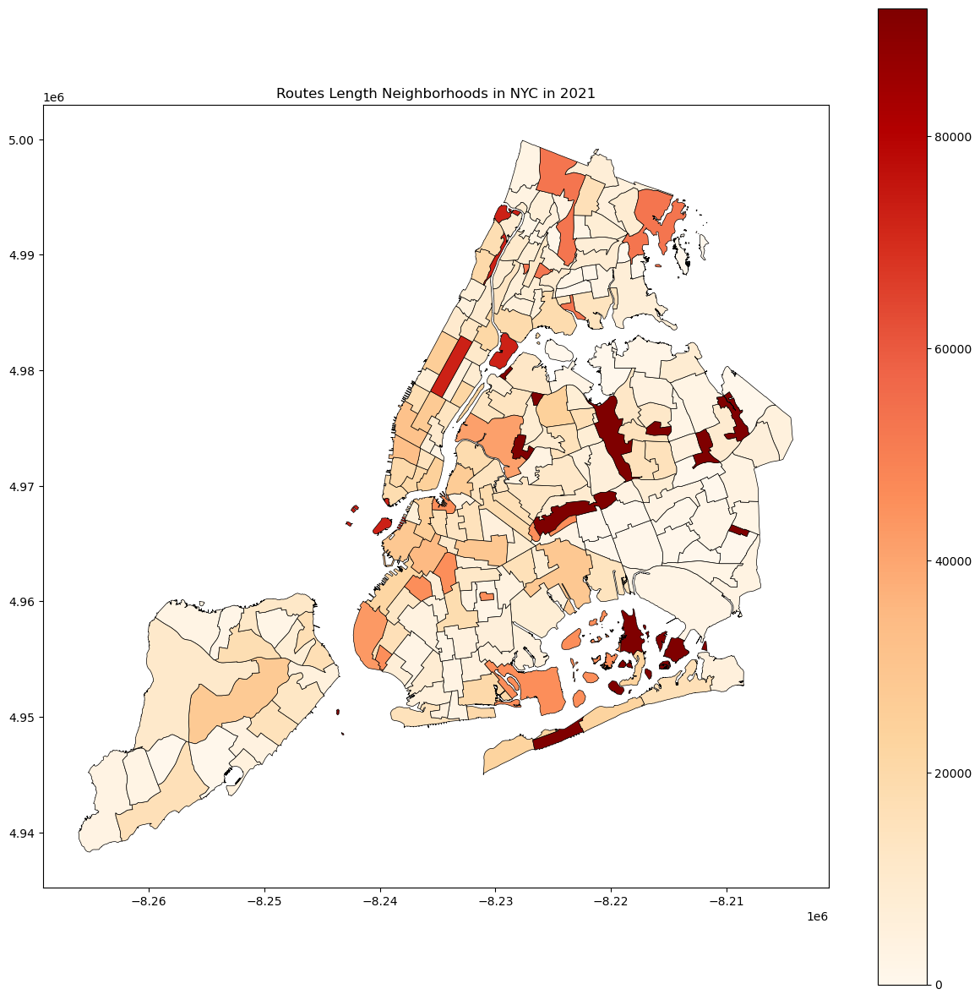

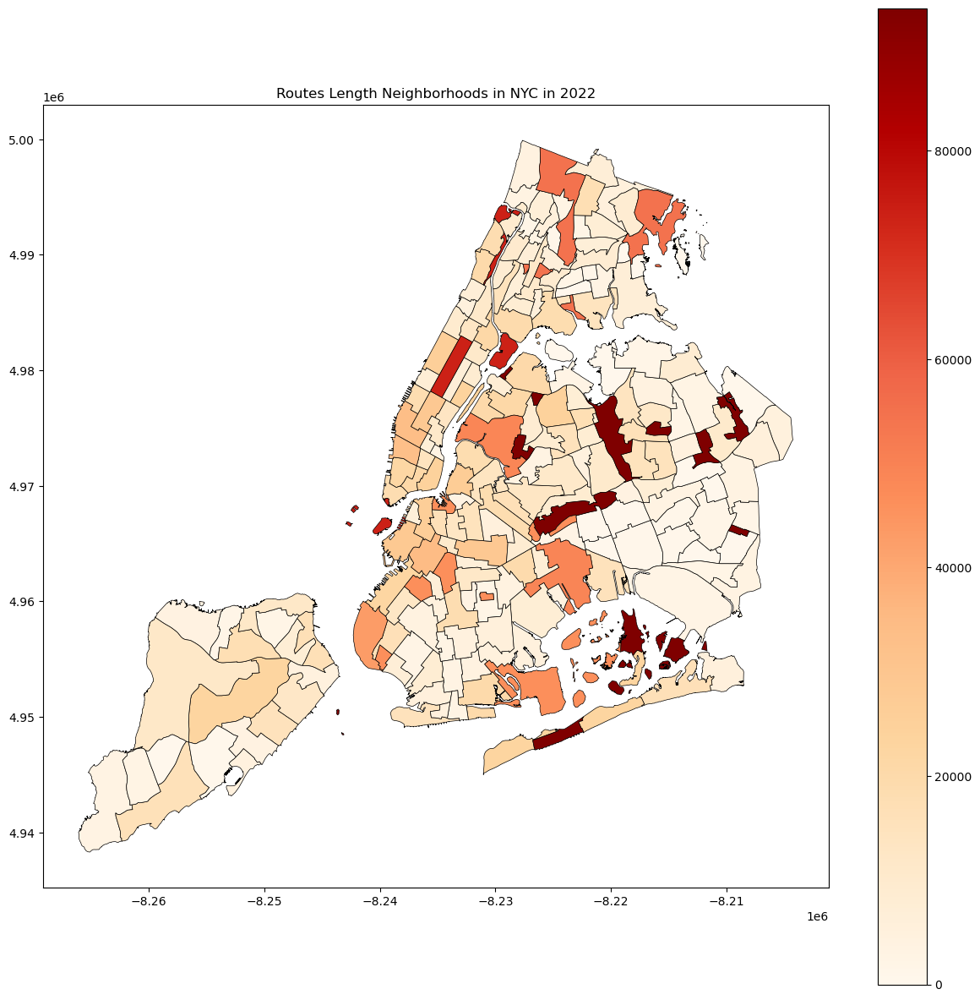

In [6]:
# display length
for i in years:
    fig, ax = plt.subplots(figsize=(15, 15))
    neighborhoods.plot(ax=ax, column=f'route_length_{i}', legend=True, cmap='OrRd', linewidth=0.5, edgecolor='black')
    plt.title(f'Routes Length Neighborhoods in NYC in {i}')
    plt.axis('on')
    plt.show()

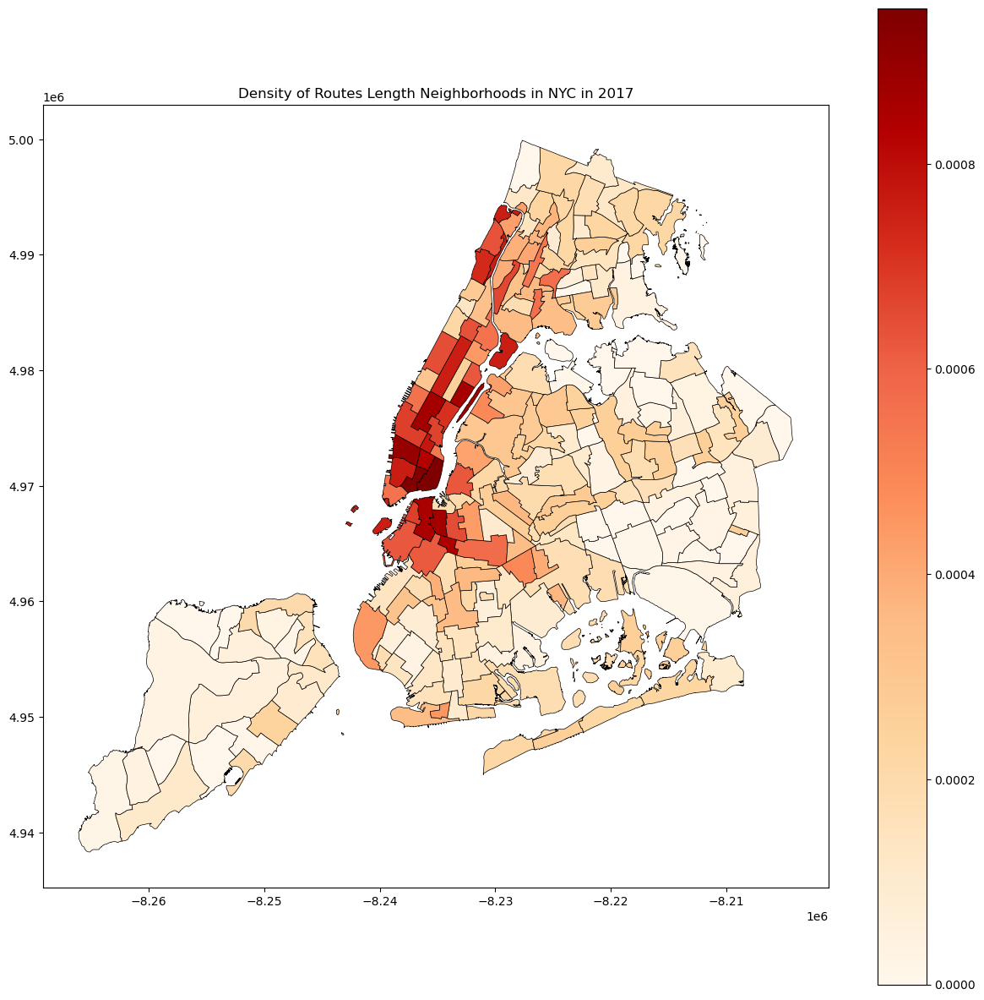

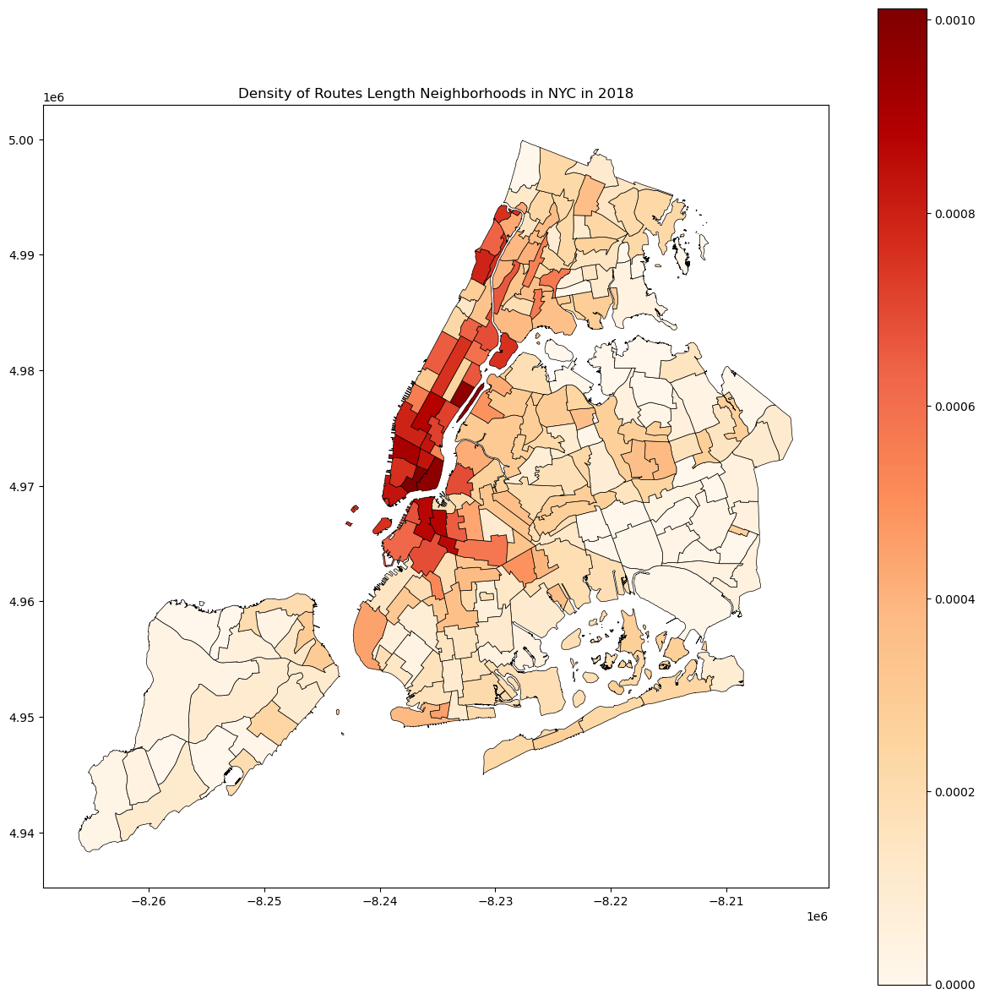

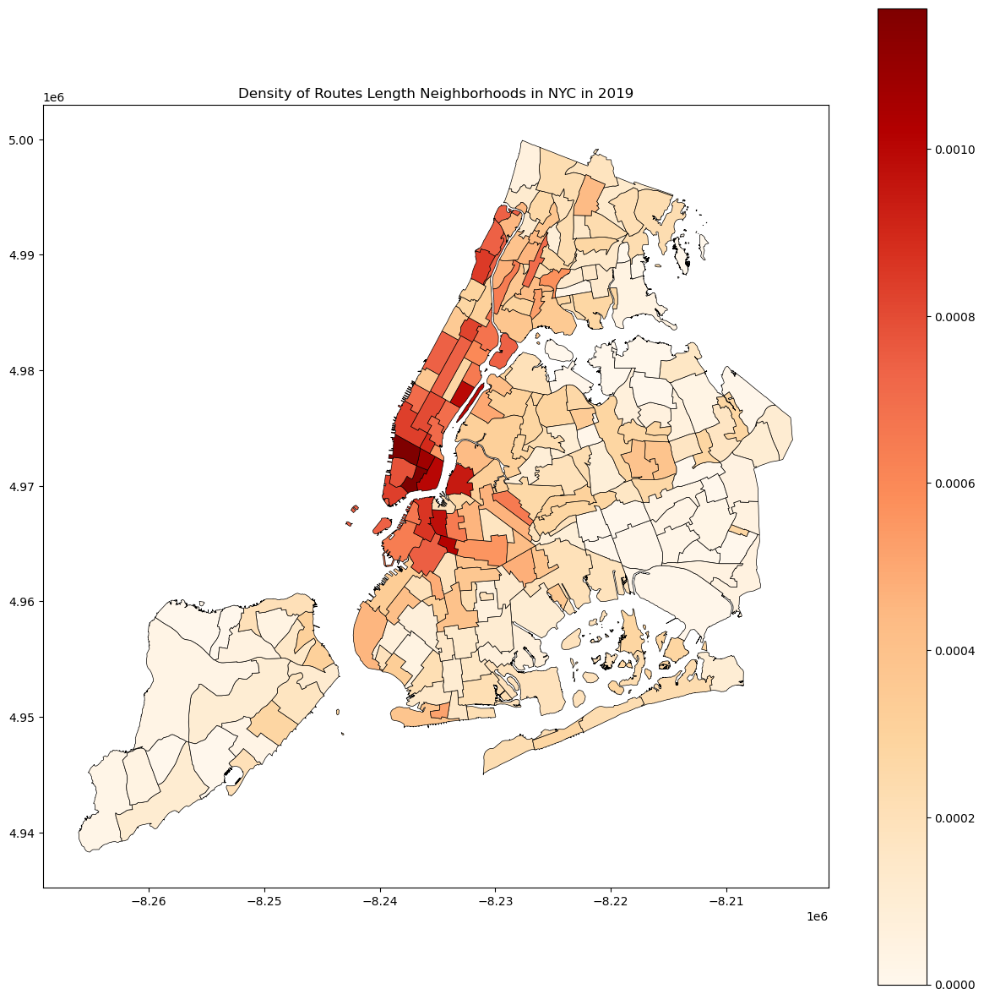

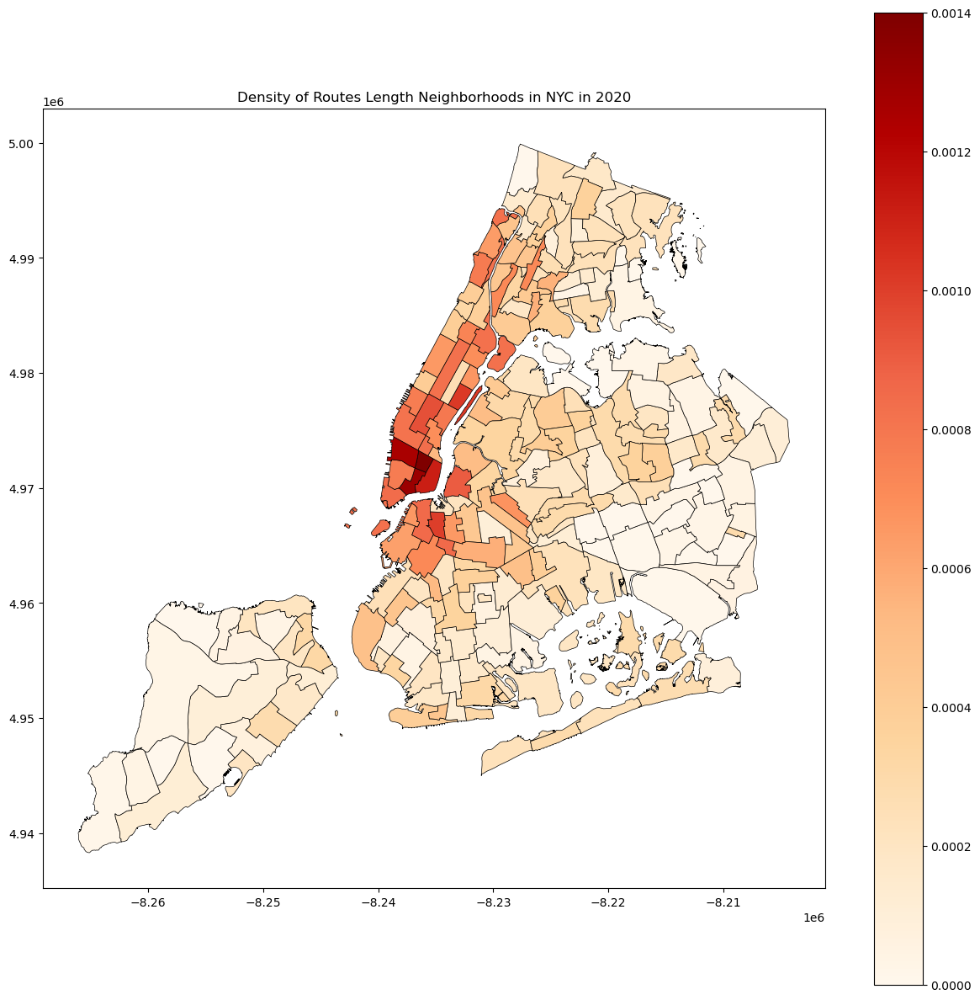

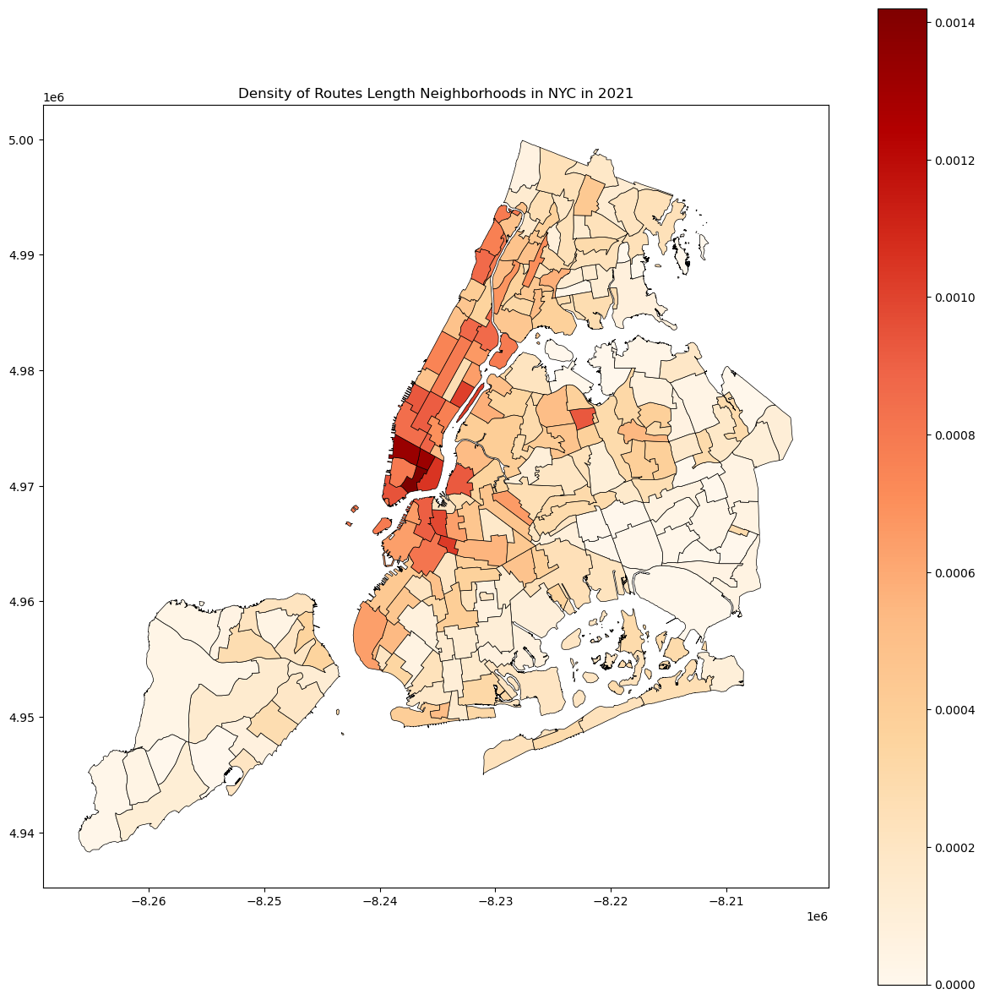

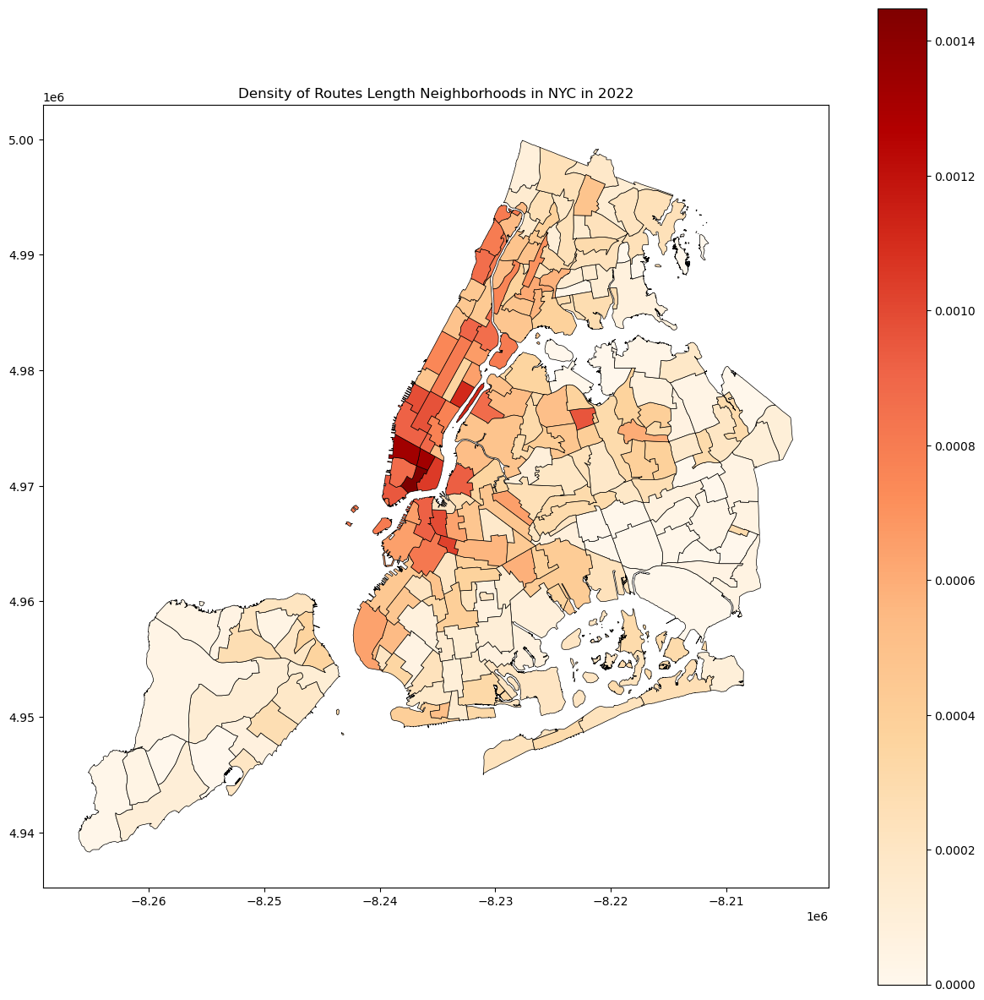

In [7]:
# display density
for i in years:
    fig, ax = plt.subplots(figsize=(15, 15))
    neighborhoods.plot(ax=ax, column=f'density_route_length_{i}', legend=True, cmap='OrRd', linewidth=0.5, edgecolor='black')
    plt.title(f'Density of Routes Length Neighborhoods in NYC in {i}')
    plt.axis('on')
    plt.show()

In [8]:
# adjust the different columns names
'''
for i in range(len(years)):
print(bikeroutes[i].columns)
'''
bikeId = []
for i in range(len(years[:2])):
    bikeroutes[i]['SegmentID'] = bikeroutes[i]['SegmentID'].astype(str)
    temp = bikeroutes[i][['SegmentID','geometry','year','route_length','bikedir','allclasses','lanecount']]
    bikeId.append(temp)

bikeroutes[2] = bikeroutes[2].rename(columns={'segment_id': 'SegmentID'})
bikeroutes[2]['SegmentID'] = bikeroutes[2]['SegmentID'].astype(str)
temp = bikeroutes[2][['SegmentID','geometry','year','route_length','bikedir','allclasses','lanecount']]
bikeId.append(temp)

for i in range(3,6):
    bikeroutes[i] = bikeroutes[i].rename(columns={'segmentid': 'SegmentID'})
    bikeroutes[i]['SegmentID'] = bikeroutes[i]['SegmentID'].astype(str)
    temp = bikeroutes[i][['SegmentID','geometry','year','route_length','bikedir','allclasses','lanecount']]
    bikeId.append(temp)

In [9]:
# join in one dataframe
merged_bikeId = pd.concat(bikeId, ignore_index=True)
merged_bikeId

,SegmentID,geometry,year,route_length,bikedir,allclasses,lanecount
0,33547,"LINESTRING (-8237686.650 4975208.291, -8237635...",2017,106.056793,L,I,1.0
1,22630,"LINESTRING (-8236248.445 4964625.549, -8236306...",2017,109.445768,R,II,1.0
2,299123,"LINESTRING (-8236362.349 4967803.928, -8236368...",2017,148.803348,L,II,1.0
3,34170,"LINESTRING (-8235669.142 4975768.052, -8236026...",2017,409.592978,R,III,1.0
4,43043,"LINESTRING (-8231129.559 4966101.832, -8231113...",2017,108.883808,L,II,1.0
...,...,...,...,...,...,...,...
107175,233514.0,"LINESTRING (-8210602.028 4977352.938, -8210609...",2022,8.070658,2,I,2.0
107176,233466.0,"LINESTRING (-8210458.602 4977396.661, -8210474...",2022,16.672291,2,I,2.0
107177,163713.0,"LINESTRING (-8234027.994 4965515.344, -8234025...",2022,12.320392,2,II,2.0
107178,163714.0,"LINESTRING (-8234021.982 4965488.555, -8234044...",2022,95.248772,2,II,2.0


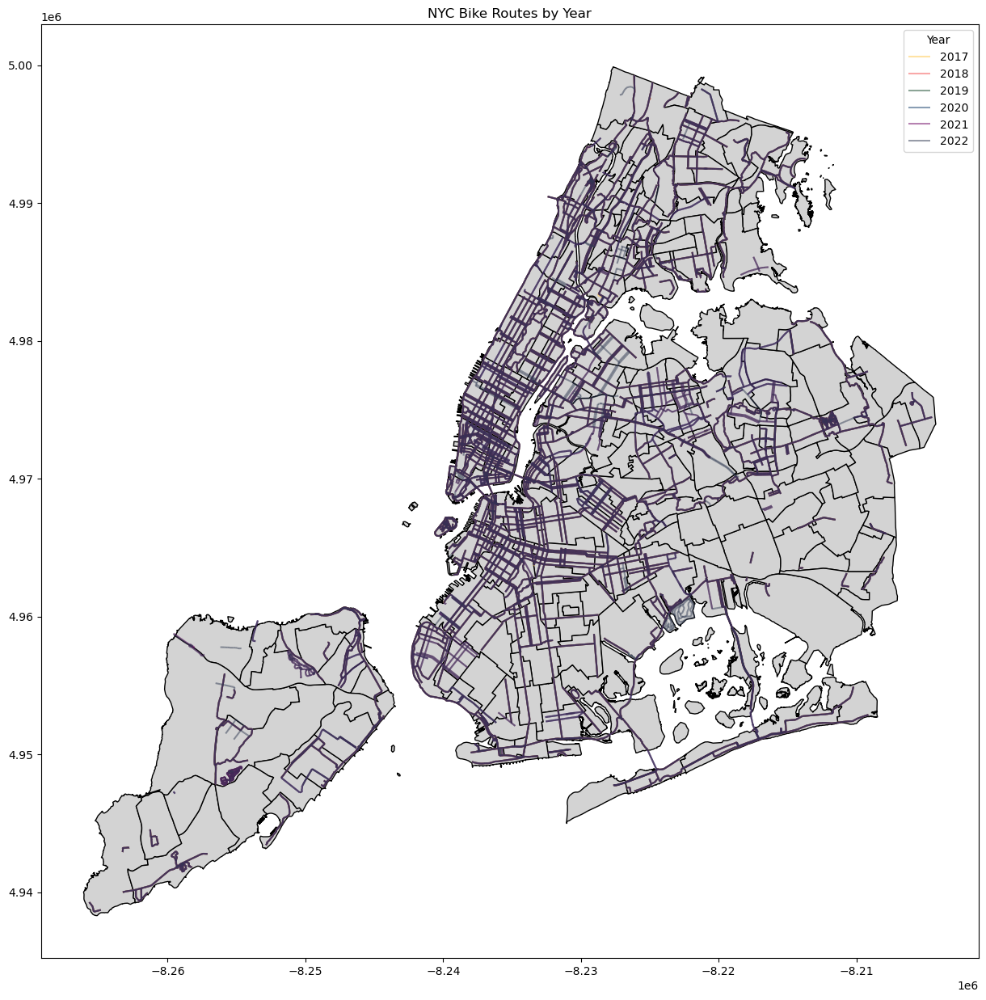

In [10]:
# all routes in one graph

gdf = gpd.GeoDataFrame(pd.concat(bikeId, ignore_index=True))

colors = {'2017': '#FFC94A', '2018': '#F55353', '2019': '#1A4D2E', '2020': '#143F6B', '2021': '#6F0765', '2022': '#303A52'}

fig, ax = plt.subplots(figsize=(15, 15))

for year, color in colors.items():
    gdf[gdf['year'] == year].plot(ax=ax, color=color,label=year, alpha=0.5)
neighborhoods.plot(ax=ax, color='lightgrey', edgecolor='black')

ax.legend(title='Year')
ax.set_title('NYC Bike Routes by Year')

plt.show()

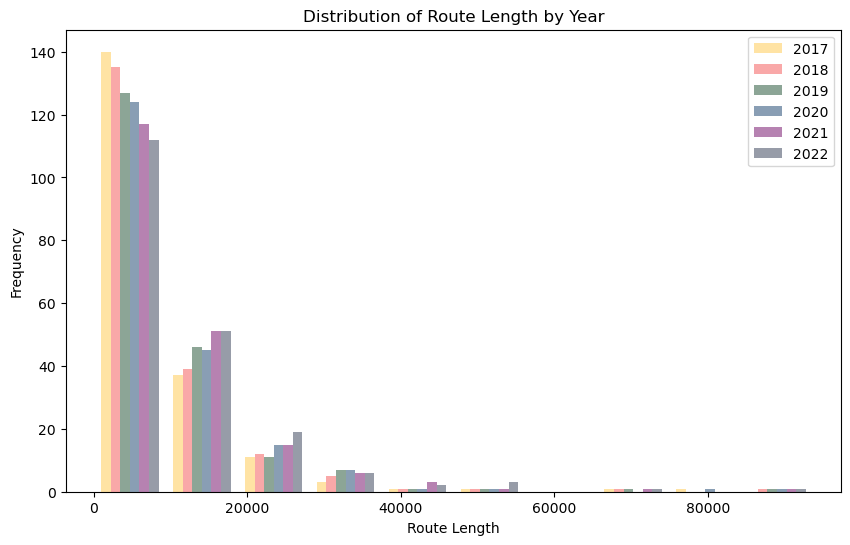

In [11]:
# length statistics

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))

plt.hist([neighborhoods['route_length_2017'], neighborhoods['route_length_2018'], 
          neighborhoods['route_length_2019'], neighborhoods['route_length_2020'], 
          neighborhoods['route_length_2021'], neighborhoods['route_length_2022']], 
         bins=10, color=['#FFC94A', '#F55353', '#1A4D2E', '#143F6B', '#6F0765', '#303A52'], 
         label=['2017', '2018', '2019', '2020', '2021', '2022'], stacked=False, alpha=0.5)

plt.title('Distribution of Route Length by Year')
plt.xlabel('Route Length')
plt.ylabel('Frequency')
plt.legend()

plt.show()


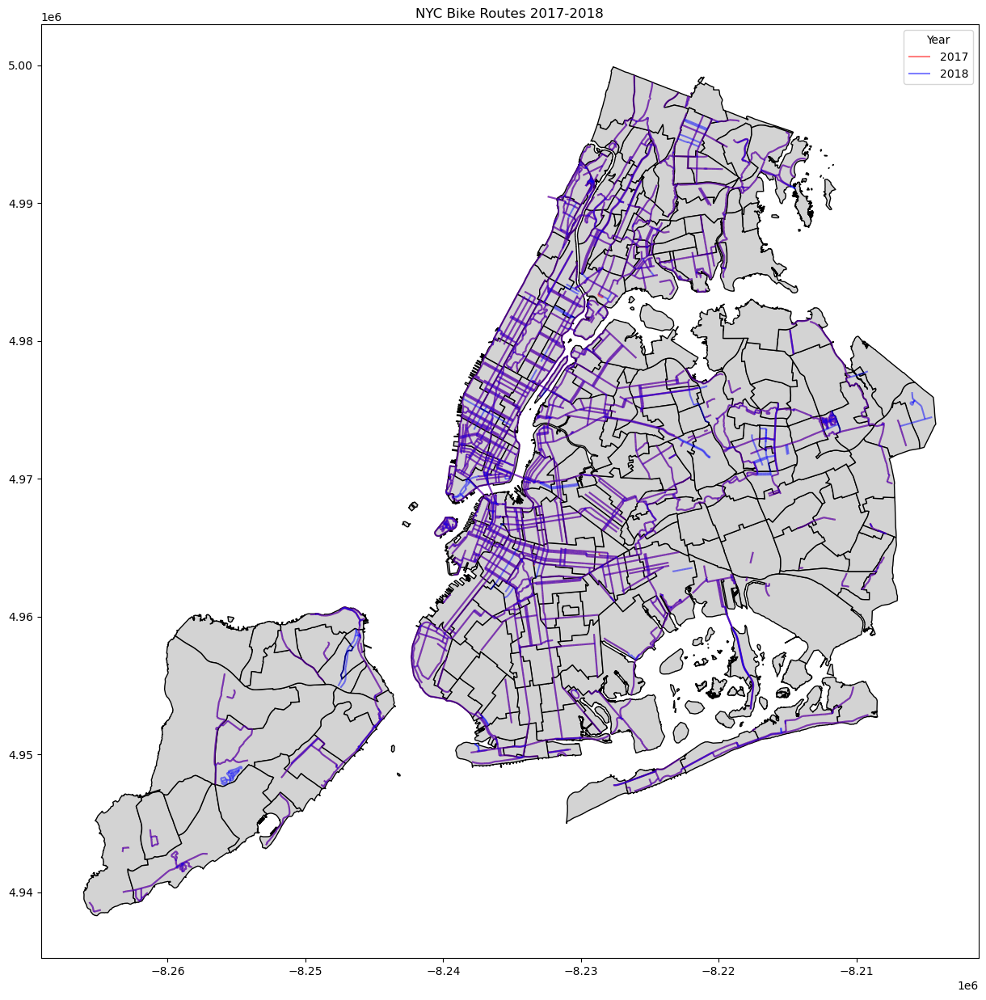

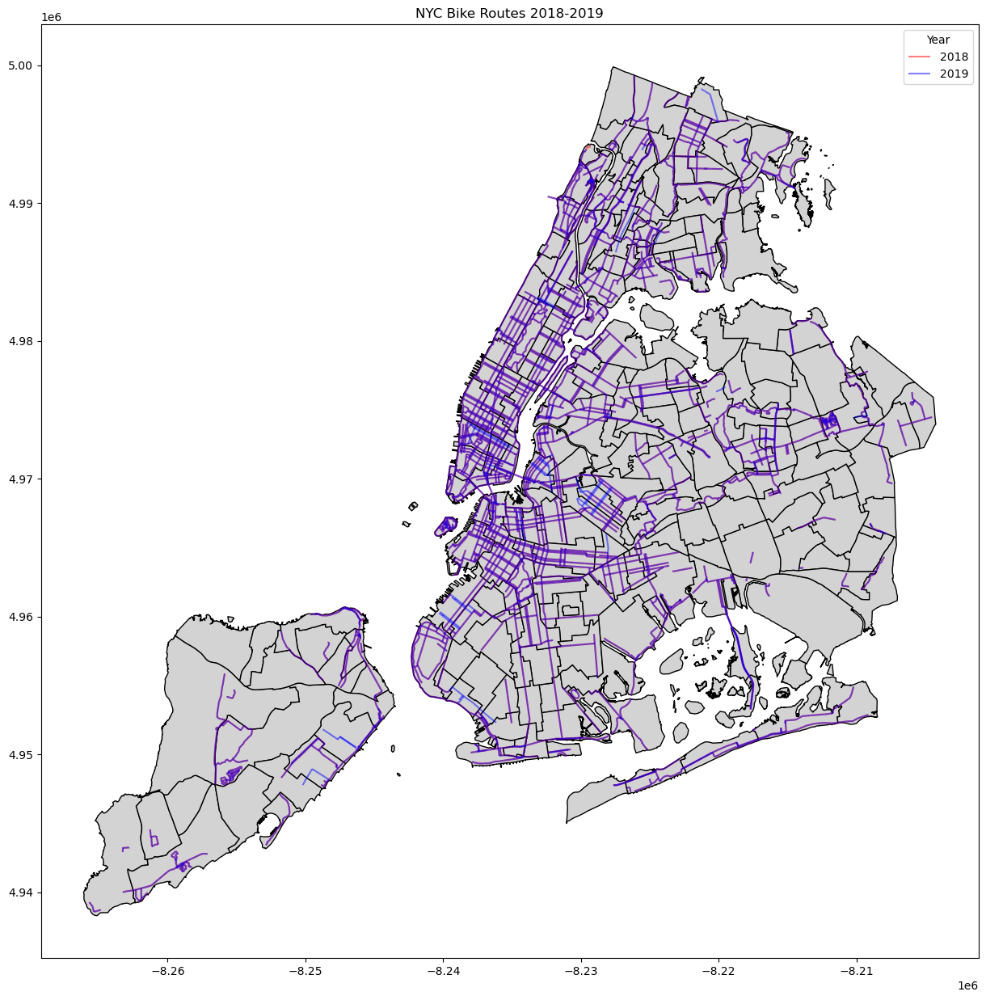

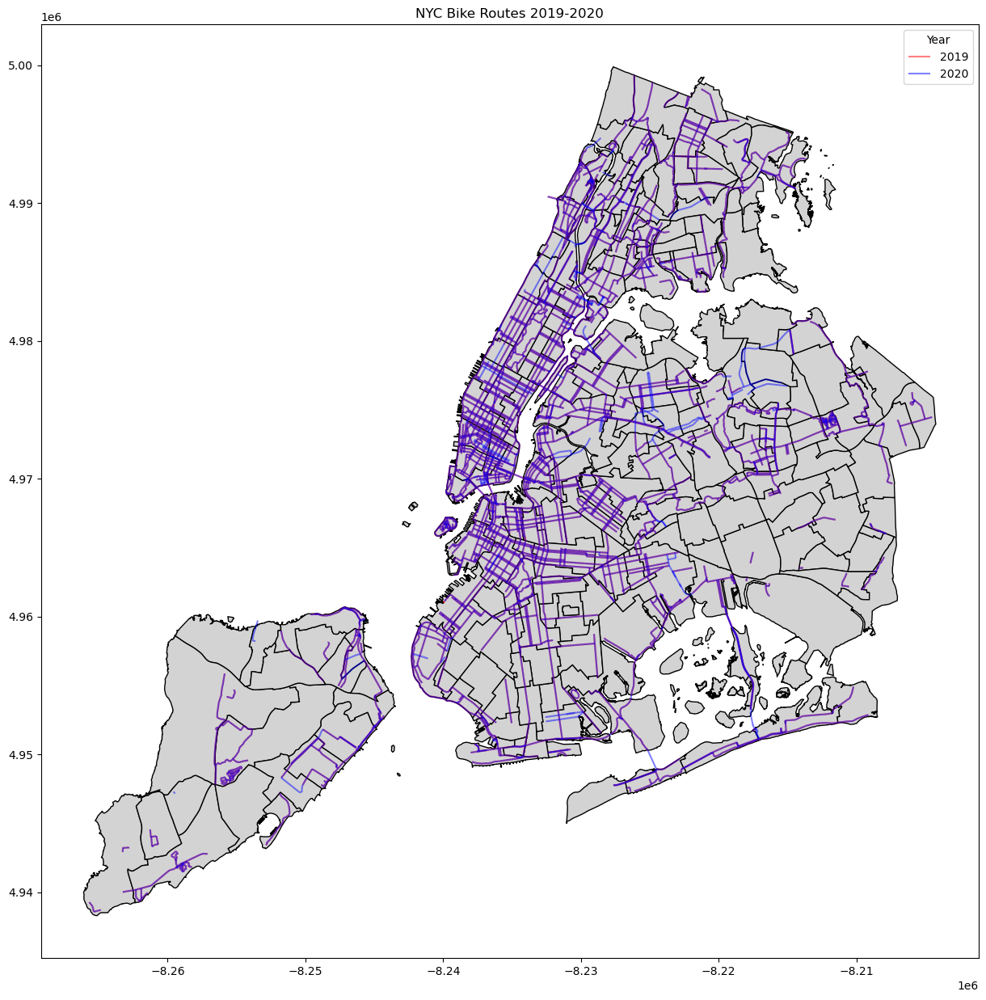

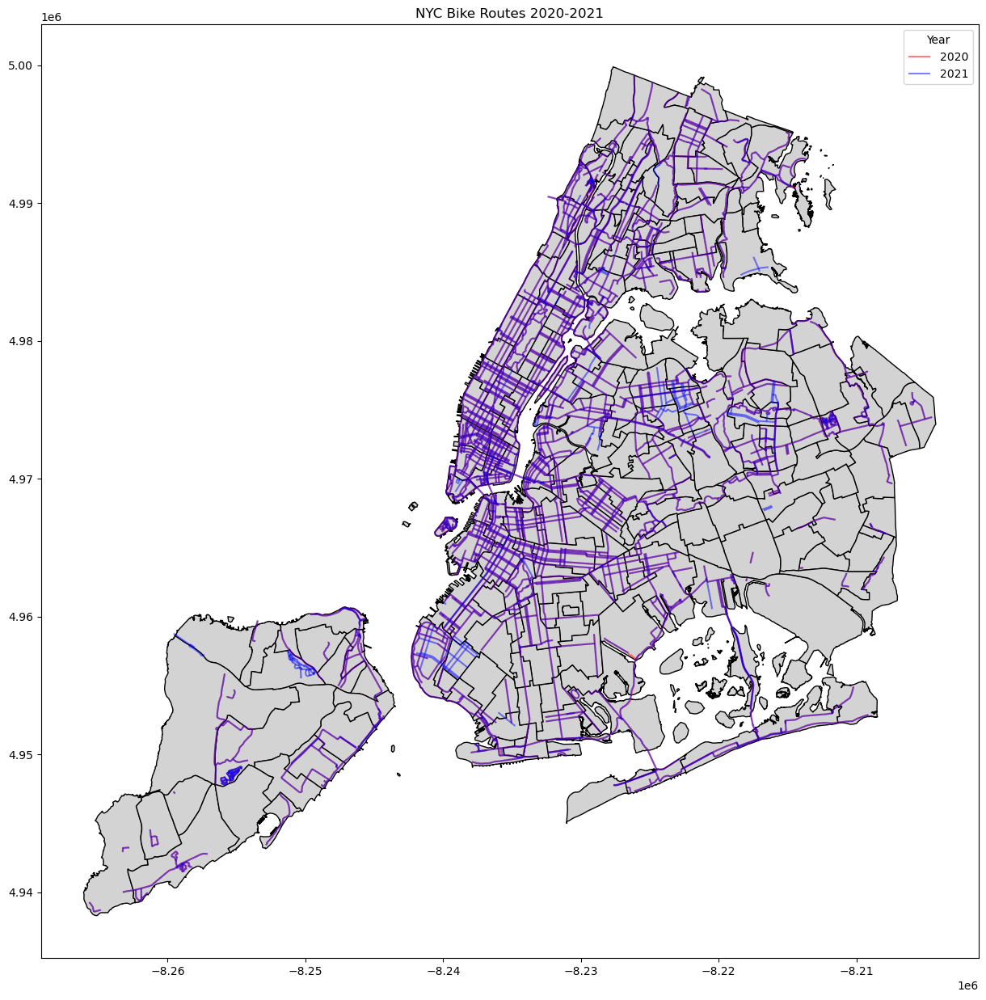

In [12]:
# difference in each two years
gdf = gpd.GeoDataFrame(pd.concat(bikeId, ignore_index=True))

colors = {'2017-2018': ['red', 'blue'],
          '2018-2019': ['red', 'blue'],
          '2019-2020': ['red', 'blue'],
          '2020-2021': ['red', 'blue']}

for year_range, color_list in colors.items():
    fig, ax = plt.subplots(figsize=(15, 15))
    for year, color in zip(range(int(year_range.split('-')[0]), int(year_range.split('-')[1])), color_list):
        gdf[gdf['year'] == str(year)].plot(ax=ax, color=color_list[0], label=str(year), alpha=0.5)
        gdf[gdf['year'] == str(year + 1)].plot(ax=ax, color=color_list[1], label=str(year + 1), alpha=0.5)
        neighborhoods.plot(ax=ax, color='lightgrey', edgecolor='black')

    ax.legend(title='Year')
    ax.set_title(f'NYC Bike Routes {year_range}')
    plt.show()


In [13]:
# features of routes
# 2022 data

lists = ['SegmentID','geometry','year','route_length','facilitycl','onoffst','bikedir','allclasses','lanecount']
bike2022 = bikeroutes[-1][lists]
# facilitycl
# Shows the highest facility class found along a segment. For an example, 
# if a segment has a protected bike lane on one side of the street (class I) 
# and a shared lane (class III) on the opposite, then this field will show “I”.

# onoffst
# On Street Status

# bikedir
# Travel direction based on LION geometry.

# lanecount
# The number of bike lanes on a segment in any direction.

In [14]:
def get_max_class(class_list):
    class_order = ['I', 'II', 'III','L']
    max_class = 'III'
    for class_name in class_order:
        if class_name in class_list:
            max_class = class_name
    return max_class

In [15]:
bike2022['allclasses'] = bike2022['allclasses'].apply(lambda x: get_max_class(x.split(',')))
gdf = gpd.GeoDataFrame(bike2022)

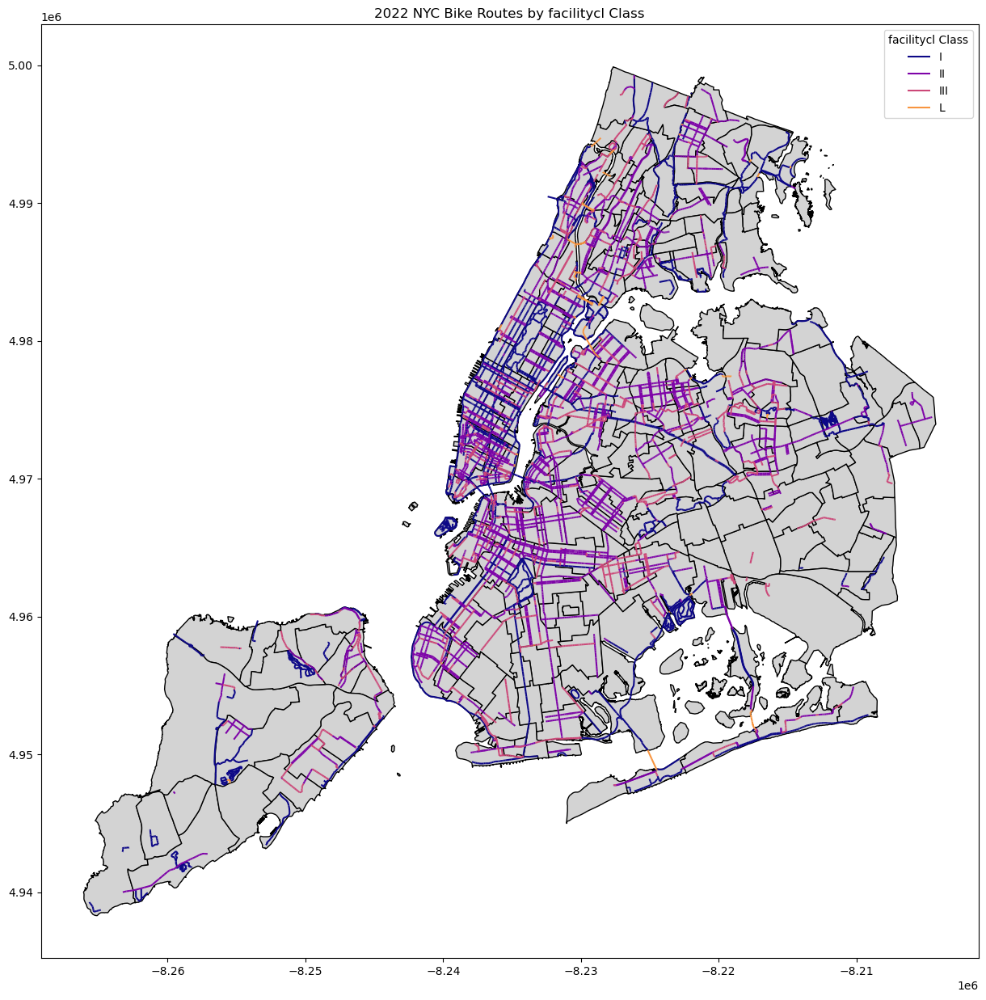

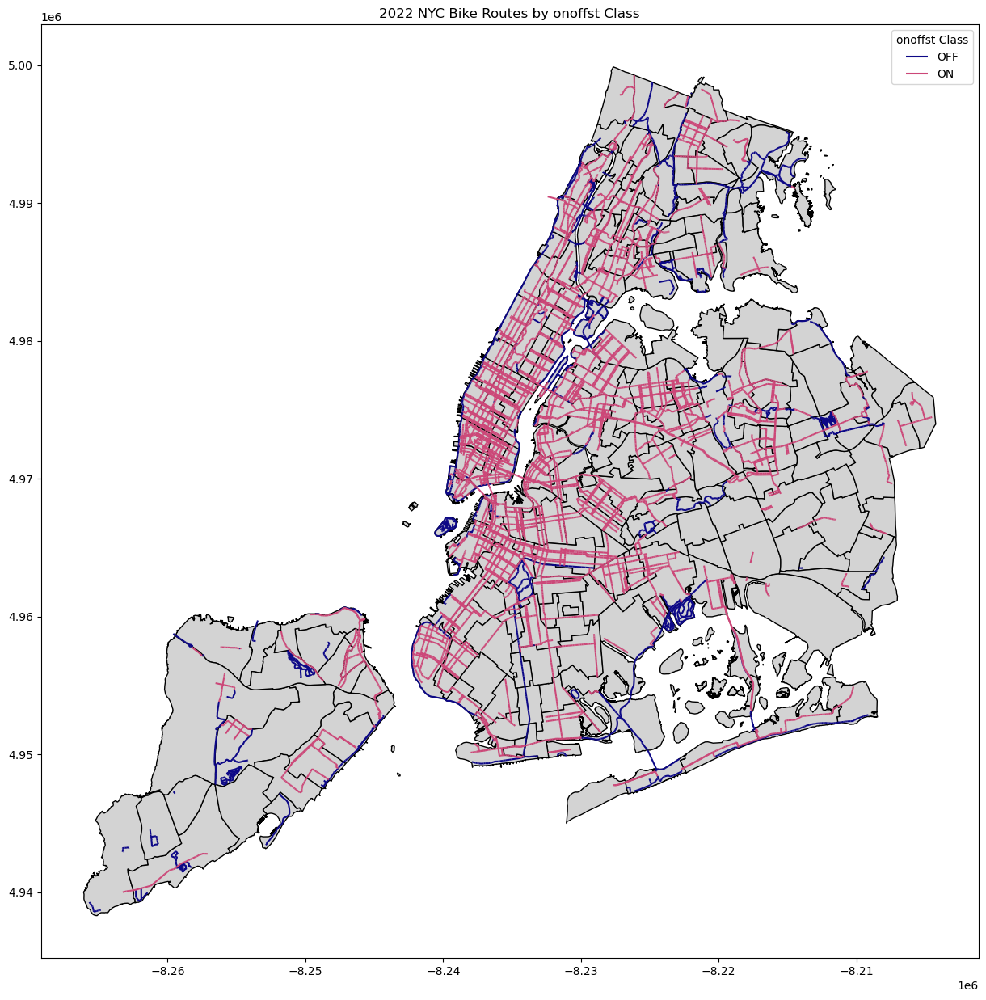

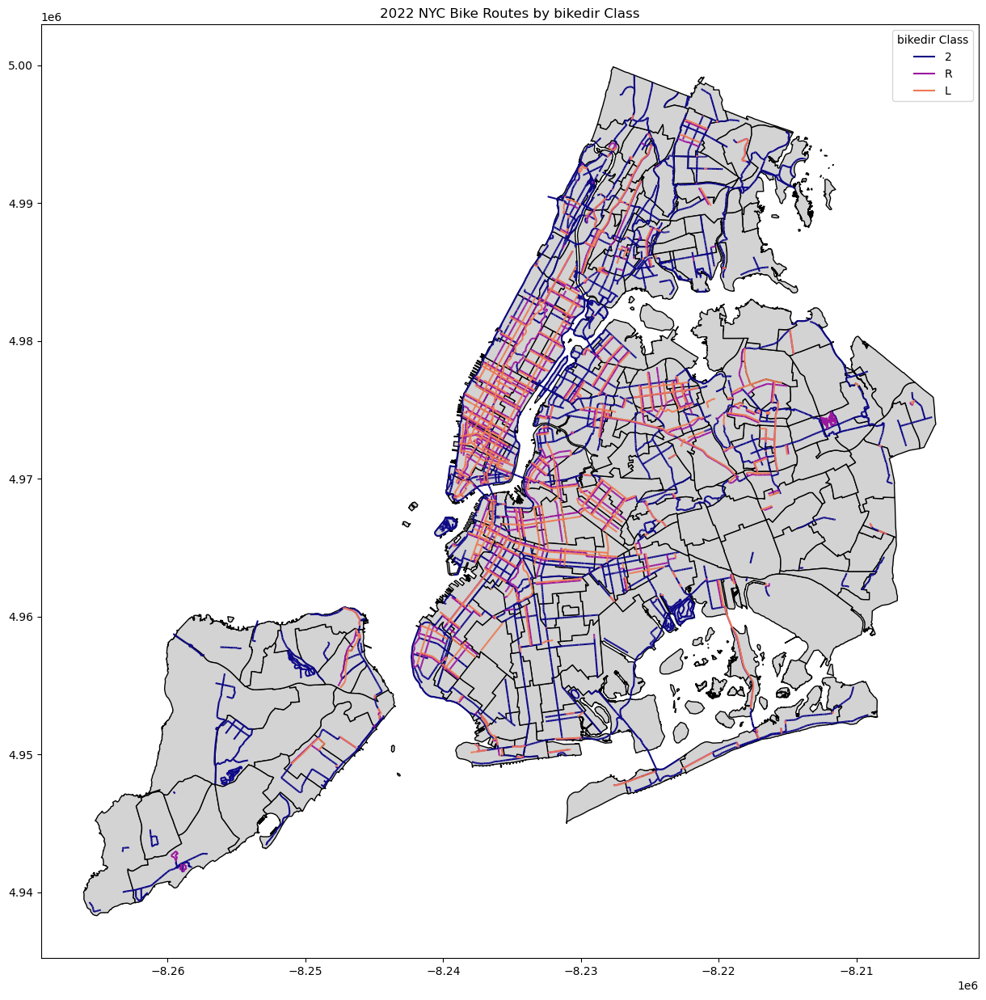

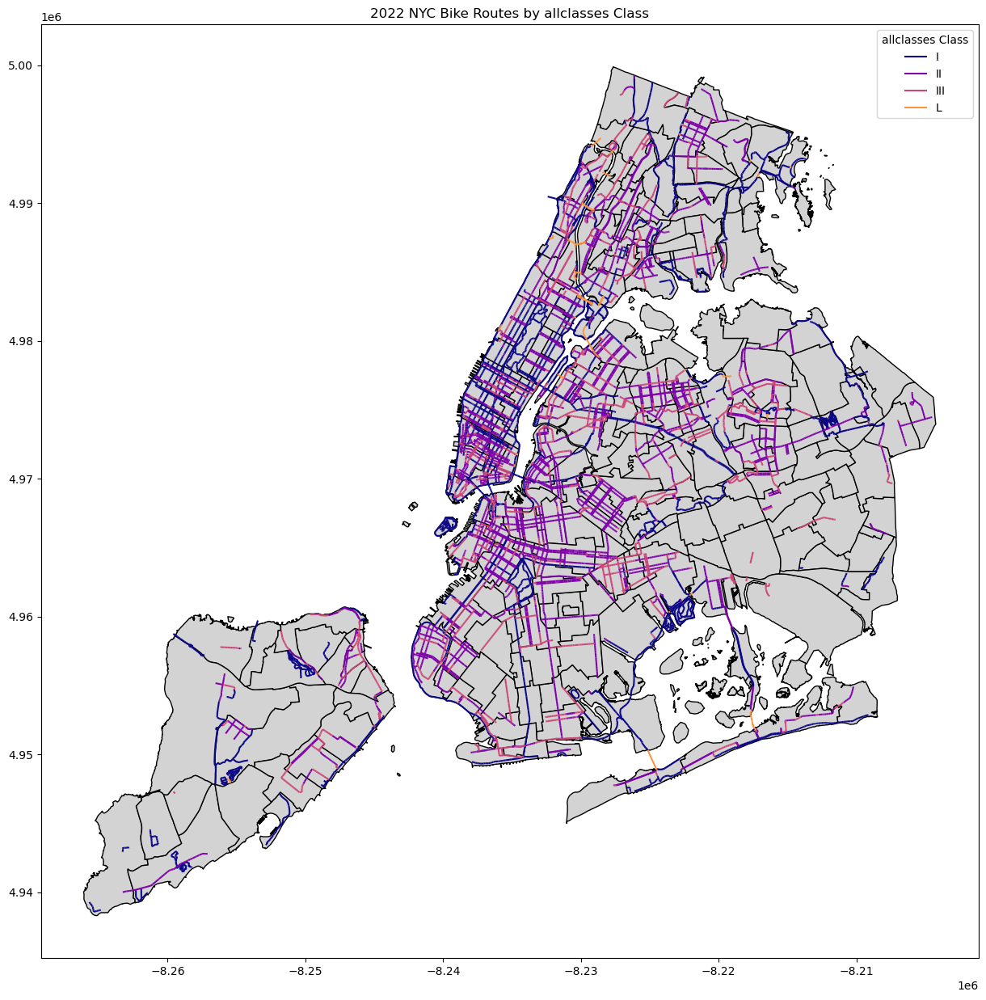

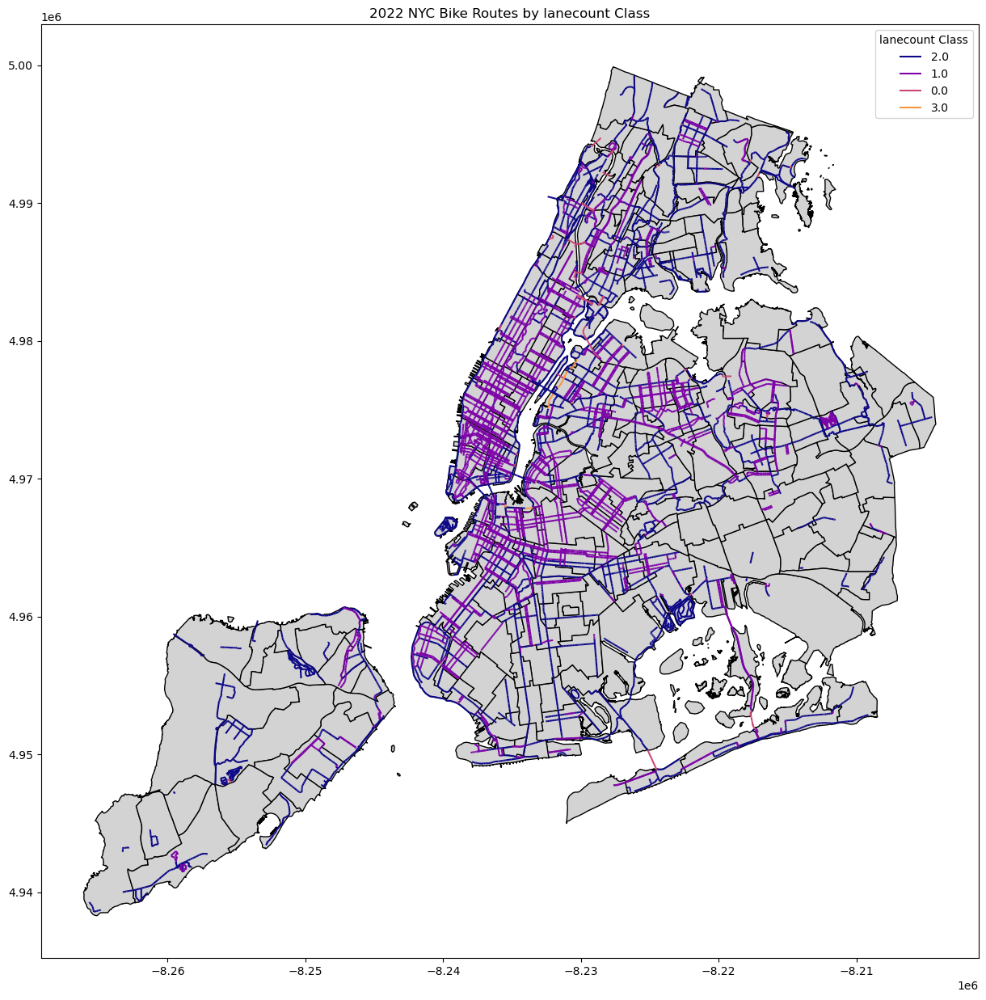

In [16]:
# distribution by different feature

color_map = plt.cm.plasma

for l in lists[4:]:
    fig, ax = plt.subplots(figsize=(15, 15))
    features = gdf[l].unique()
    for i in range(len(features)):
        gdf[gdf[l] == features[i]].plot(ax=ax, label=features[i], color=color_map(i/len(features)))
    neighborhoods.plot(ax=ax, color='lightgrey', edgecolor='black')

    ax.legend(title=f'{l} Class')
    ax.set_title(f'2022 NYC Bike Routes by {l} Class')

plt.show()

In [17]:
merged_data = gpd.sjoin(neighborhoods, bike2022, how='right', op='intersects')

In [18]:
# add different features in neighborhoods
for l in ['facilitycl','onoffst','bikedir','allclasses','lanecount']:
    
    for i in merged_data[l].unique():
        count = merged_data[merged_data[l] == i].groupby('ntacode').size().reset_index(name=f'{l}_{i}')
        neighborhoods = neighborhoods.merge(count, on='ntacode', how='left')

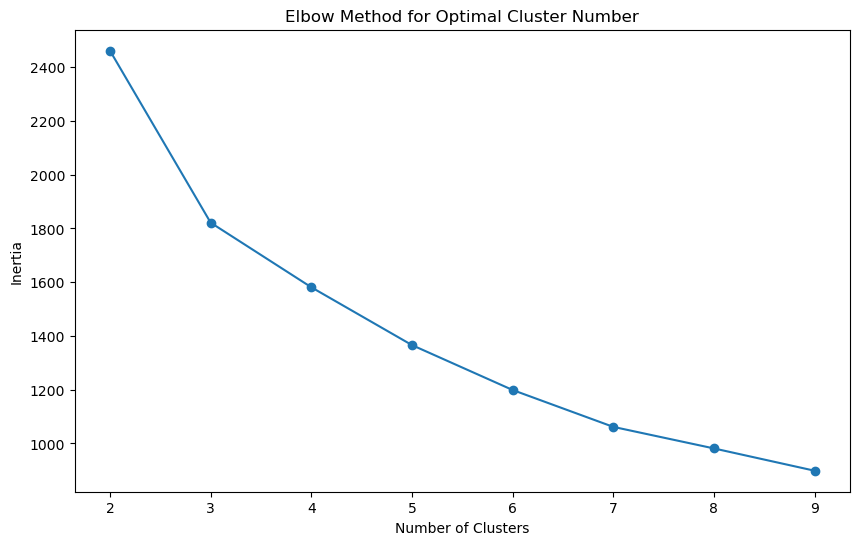

In [19]:
# cluster by many features 
temp = neighborhoods.copy()
temp.fillna(0, inplace=True)

columns_for_clustering = ['route_length_2022',
       'density_route_length_2022', 'facilitycl_I', 'facilitycl_II',
       'facilitycl_III', 'facilitycl_L', 'onoffst_OFF', 'onoffst_ON',
       'bikedir_2', 'bikedir_R', 'bikedir_L', 'allclasses_I', 'allclasses_II',
       'allclasses_III', 'allclasses_L', 'lanecount_2.0', 'lanecount_1.0',
       'lanecount_0.0', 'lanecount_3.0']
X = temp[columns_for_clustering]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

k_range = range(2, 10)
elbow_scores = []
silhouette_scores = []

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    elbow_scores.append(kmeans.inertia_)  
    silhouette_scores.append(silhouette_score(X_scaled, kmeans.labels_))

plt.figure(figsize=(10, 6))
plt.plot(k_range, elbow_scores, marker='o')
plt.title('Elbow Method for Optimal Cluster Number')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.xticks(k_range)
plt.show()


In [20]:
temp = neighborhoods.copy()
temp.fillna(0, inplace=True)
kmeans = KMeans(n_clusters=3, random_state=42)
temp['cluster'] = kmeans.fit_predict(X_scaled)

print(temp['cluster'].value_counts())

cluster
0    146
1     45
2      4
Name: count, dtype: int64


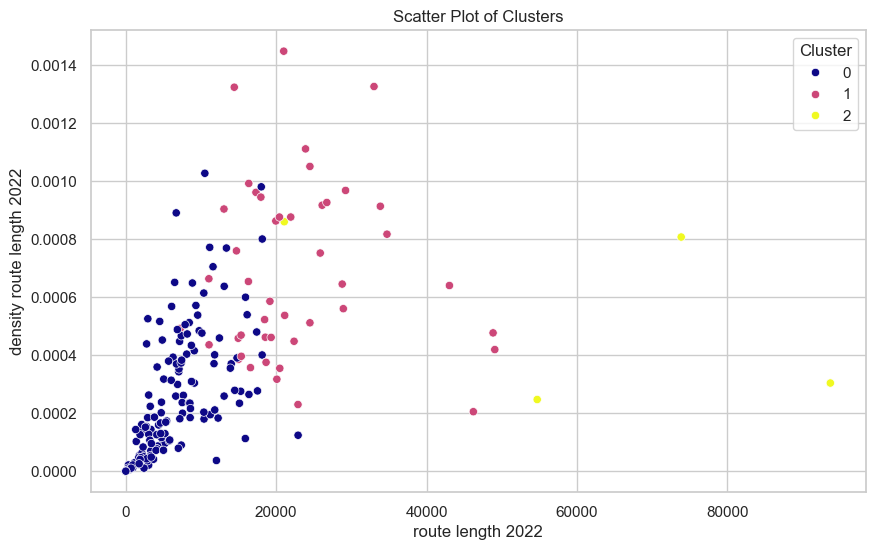

In [21]:
sns.set(style="whitegrid")

plt.figure(figsize=(10, 6))
sns.scatterplot(x='route_length_2022', y='density_route_length_2022', hue='cluster', data=temp, palette='plasma')
plt.title('Scatter Plot of Clusters')
plt.xlabel('route length 2022')
plt.ylabel('density route length 2022')
plt.legend(title='Cluster')
plt.show()


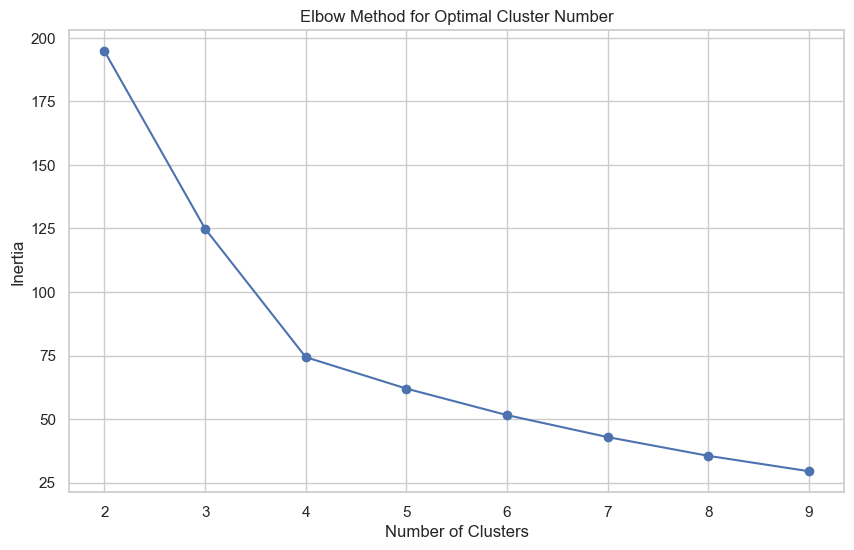

In [22]:
# cluster by length and density 

temp = neighborhoods.copy()
temp.fillna(0, inplace=True)

columns_for_clustering = ['route_length_2022', 'density_route_length_2022']
X = temp[columns_for_clustering]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)



k_range = range(2, 10)
elbow_scores = []
silhouette_scores = []

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    elbow_scores.append(kmeans.inertia_)  
    silhouette_scores.append(silhouette_score(X_scaled, kmeans.labels_))

plt.figure(figsize=(10, 6))
plt.plot(k_range, elbow_scores, marker='o')
plt.title('Elbow Method for Optimal Cluster Number')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.xticks(k_range)
plt.show()

In [23]:
temp = neighborhoods.copy()
temp.fillna(0, inplace=True)
kmeans = KMeans(n_clusters=4, random_state=42)
temp['cluster'] = kmeans.fit_predict(X_scaled)

print(temp['cluster'].value_counts())

cluster
2    86
0    74
3    28
1     7
Name: count, dtype: int64


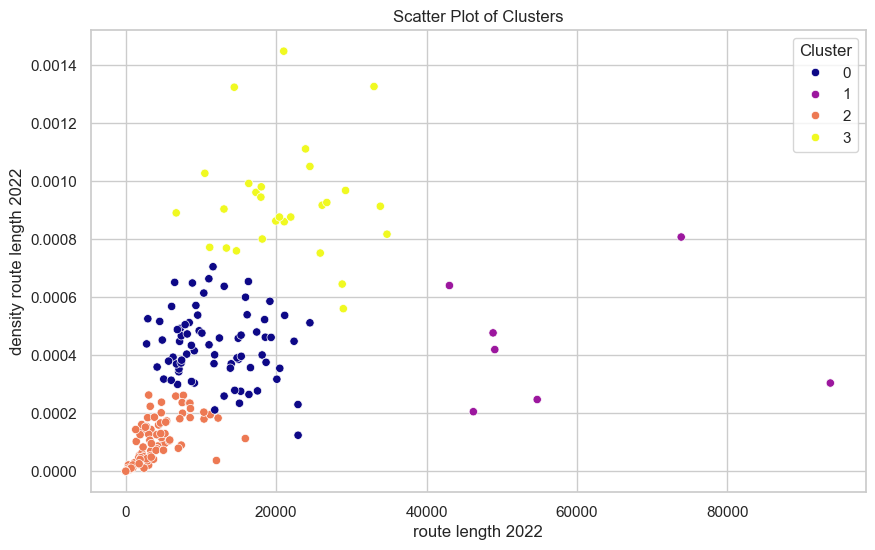

In [24]:
sns.set(style="whitegrid")

plt.figure(figsize=(10, 6))
sns.scatterplot(x='route_length_2022', y='density_route_length_2022', hue='cluster', data=temp, palette='plasma')
plt.title('Scatter Plot of Clusters')
plt.xlabel('route length 2022')
plt.ylabel('density route length 2022')
plt.legend(title='Cluster')
plt.show()

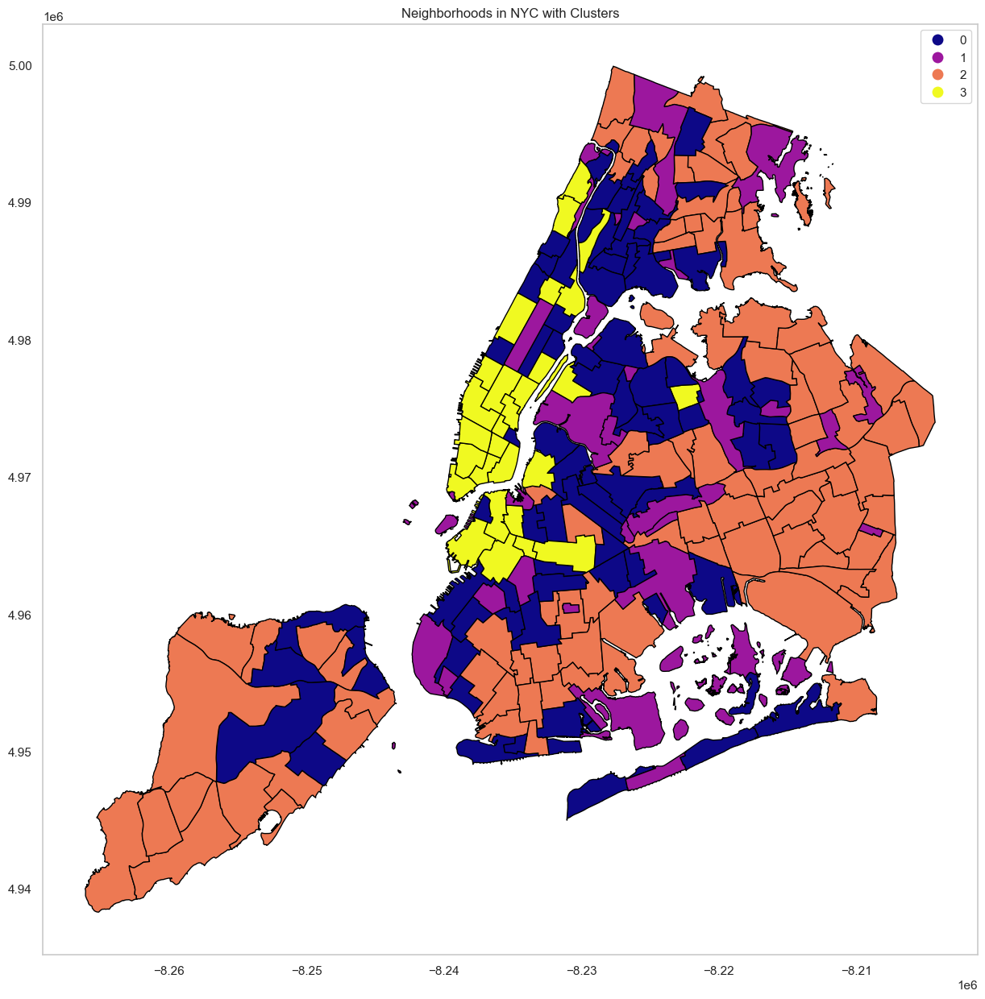

In [25]:
temp['cluster'] = temp['cluster'].astype(str)
fig, ax = plt.subplots(figsize=(15, 15))
temp.plot(ax=ax, column='cluster', legend=True, cmap='plasma', edgecolor='black')
plt.title('Neighborhoods in NYC with Clusters')
plt.axis('on')
ax.grid(False)
plt.show()

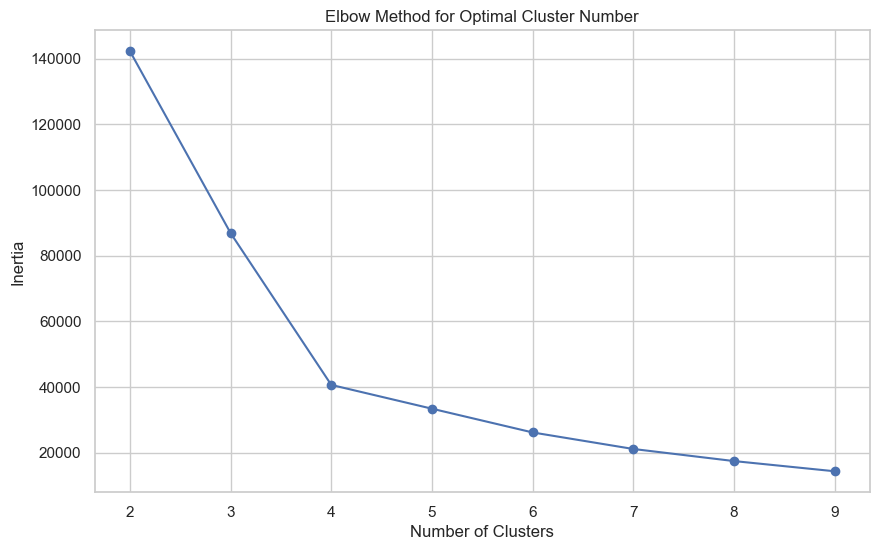

In [26]:
# clustering of routes
columns_for_clustering = ['route_length', 'facilitycl','allclasses', 'lanecount']

X = bike2022[columns_for_clustering]
X_encoded = pd.get_dummies(X)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_encoded)

k_range = range(2, 10)
elbow_scores = []
silhouette_scores = []

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    elbow_scores.append(kmeans.inertia_)  
    silhouette_scores.append(silhouette_score(X_scaled, kmeans.labels_))

plt.figure(figsize=(10, 6))
plt.plot(k_range, elbow_scores, marker='o')
plt.title('Elbow Method for Optimal Cluster Number')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.xticks(k_range)
plt.show()

In [29]:
temp = bike2022.copy()
temp.fillna(0, inplace=True)
kmeans = KMeans(n_clusters=3, random_state=42)
temp['cluster'] = kmeans.fit_predict(X_scaled)

print(temp['cluster'].value_counts())

cluster
0    9346
1    6810
2    4668
Name: count, dtype: int64


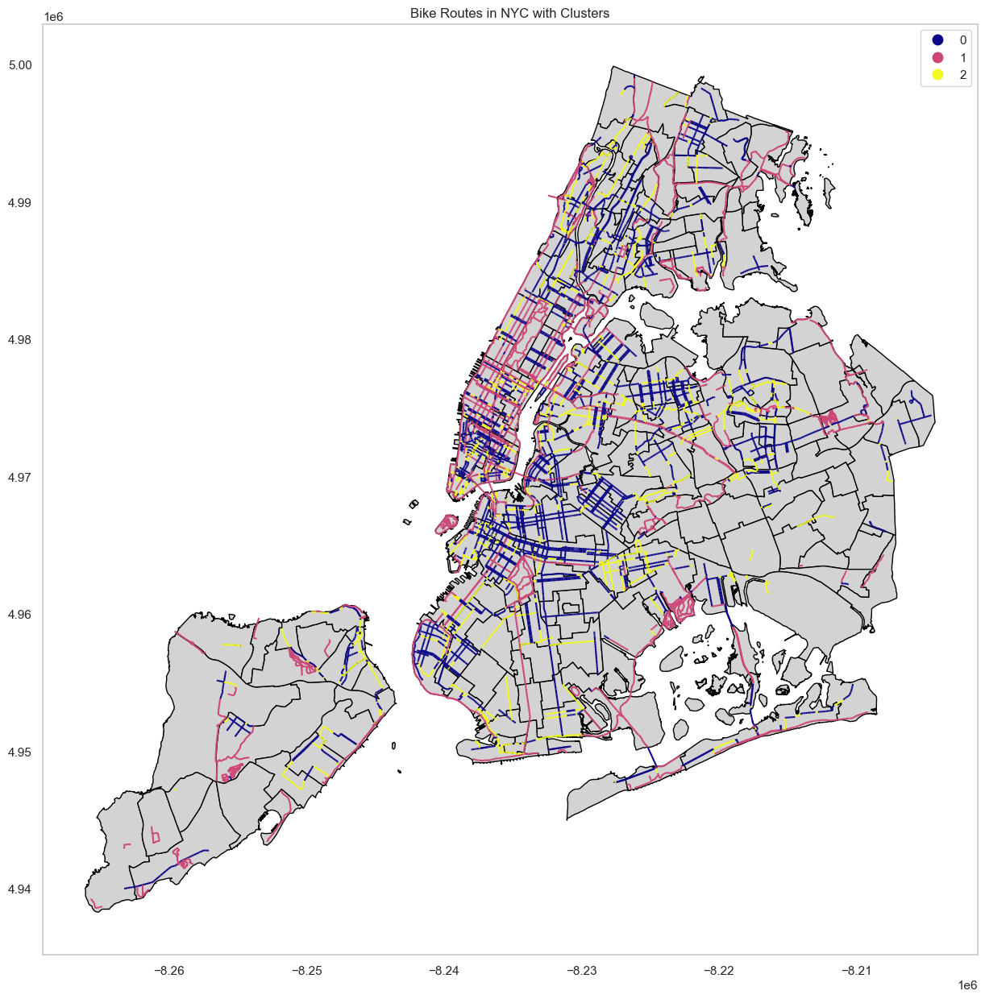

In [30]:
temp['cluster'] = temp['cluster'].astype(str)
fig, ax = plt.subplots(figsize=(15, 15))
temp.plot(ax=ax, column='cluster', legend=True, cmap='plasma')
neighborhoods.plot(ax=ax, color='lightgrey',edgecolor='black')
plt.title('Bike Routes in NYC with Clusters')
plt.axis('on')
ax.grid(False)
plt.show()